# Your Neighborhood is Killing You!
## Using Foursquare Data to Predict Regional Life Expectancy

In this project we utilize data from the Foursquare API to predict county-level life expectancies. This notebook is divided into a few sections to better understand the project.

* Data collection and cleaning
* Data analysis and visualization
* Predictive modeling
* Results & analysis

In [629]:
# Libraries
import pandas as pd
from pandas.io.json import json_normalize
import geopandas as gpd
import numpy as np
import matplotlib.pyplot as plt
import requests
import random
import math
import time
import json

#!pip install folium
import folium
from folium import plugins
from folium.plugins import HeatMap

import pylab 

#!pip install shapely
import shapely.geometry
from shapely.geometry import Polygon
from shapely.geometry import Point
from shapely.geometry import MultiPolygon

from sklearn import linear_model
from sklearn import preprocessing
from sklearn.feature_selection import RFE
from sklearn.preprocessing import PolynomialFeatures
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn import neural_network

import seaborn as sns
print("Libraries imported.")

Libraries imported.


### Data Collection & Cleaning
In this project we will collect data from two main sources, IHME for life expectancy and Foursquare for venue data. There are a few other data sources that are used to supplement these primary datasets.

#### Life expectancy data 
This file contains many years of life expectancy, we are only interested in the most recent years for each county. We will need to strip out the unnecessary data and also create an index that can be used to join to other datasets.  

In [2]:
# Import the life expectancy data 
file_path = '~/ML/ds_capstone_project/IHME_county_data_LifeExpectancy_Obesity_PhysicalActivity_NATIONAL.xlsx'
le_df = pd.read_excel(file_path) #for life expectancy dataframe
le_df

,State,County,"Male life expectancy, 1985 (years)","Female life expectancy, 1985 (years)","Male life expectancy, 1990 (years)","Female life expectancy, 1990 (years)","Male life expectancy, 1995 (years)","Female life expectancy, 1995 (years)","Male life expectancy, 2000 (years)","Female life expectancy, 2000 (years)","Male life expectancy, 2005 (years)","Female life expectancy, 2005 (years)","Male life expectancy, 2010 (years)","Female life expectancy, 2010 (years)","Difference in male life expectancy, 1985-2010 (years)","Difference in female life expectancy, 1985-2010 (years)"
0,United States,NaN,70.8,77.8,71.5,78.3,72.5,78.8,74.1,79.2,74.9,79.9,76.1,80.8,5.2,3.0
1,Alabama,NaN,69.1,76.9,69.4,77.1,69.9,77.2,71.0,77.2,71.5,77.3,72.4,77.8,3.3,0.9
2,Alabama,Autauga,68.1,77.0,68.5,77.0,69.3,77.3,71.7,77.6,72.5,77.4,73.3,78.8,5.2,1.8
3,Alabama,Baldwin,71.1,78.8,71.9,79.2,72.4,79.3,73.9,79.2,73.8,79.7,75.0,80.3,3.8,1.5
4,Alabama,Barbour,66.8,76.0,66.7,76.7,68.4,76.9,70.0,76.2,70.5,77.0,72.2,77.2,5.3,1.1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3189,Wyoming,Sweetwater,72.9,78.9,73.0,79.2,72.7,78.7,73.8,78.9,74.5,78.2,75.5,81.3,2.6,2.4
3190,Wyoming,Teton,73.0,77.5,73.9,78.5,75.7,80.1,78.1,80.9,79.7,83.5,80.9,83.3,7.9,5.8
3191,Wyoming,Uinta,73.5,79.5,73.6,78.8,74.0,79.1,74.5,79.3,75.1,79.5,74.8,79.9,1.3,0.4
3192,Wyoming,Washakie,73.1,79.9,73.2,79.5,73.9,79.5,74.8,79.3,75.2,80.1,75.9,79.3,2.8,-0.7


In [3]:
#after reviewing the data we have determined that it contains both US and State data, 
#which we want to remove as well as the the historical life expectancy

#remove rows without county data
le_df = le_df.loc[le_df['County'].notna(),:]

#rename the cumbersome columns that we need (for a moment) 
le_df.rename(columns={ le_df.columns[12]: "male" }, inplace = True)
le_df.rename(columns={ le_df.columns[13]: "female" }, inplace = True)

#add an average life expectancy stat, as we are not splitting the analysis by gender
le_df.loc[:,'avg'] = (le_df['male'] + le_df['female'])/2

#keep only the fields we want
le_df = le_df.loc[:, ['State','County','avg']]

#let's check our count of countyies
print("We have {} counties.".format(le_df.shape[0]))

We have 3142 counties.


/opt/anaconda3/lib/python3.7/site-packages/pandas/core/frame.py:4223: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(**kwargs)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:376: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = _infer_fill_value(value)
/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:494: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http:

In [4]:
#We'll need the state abbreviations for joining this to other data
#We can getthe correct state abbreviations from wikipedia  
url = 'https://en.wikipedia.org/wiki/List_of_U.S._state_abbreviations'
statescrape_df = pd.read_html(url)
statecode_df = statescrape_df[0]

In [5]:
#let's clean up the columm names and select the ones we want 
statecode_df = statecode_df.rename(columns={'Codes:  ISO ISO 3166 codes (2-letter, 3-letter, and 3-digit codes from ISO 3166-1; 2+2-letter codes from ISO 3166-2)  ANSI 2-letter and 2-digit codes from the ANSI standard INCITS 38:2009 (supersedes FIPS 5-2)  USPS 2-letter codes used by the United States Postal Service  USCG 2-letter codes used by the United States Coast Guard (bold red text shows differences between ANSI and USCG) Abbreviations:  GPO Older variable-length official US Government Printing Office abbreviations  AP Abbreviations from the AP Stylebook (bold red text shows differences between GPO and AP)':'name', 'Codes:  ISO ISO 3166 codes (2-letter, 3-letter, and 3-digit codes from ISO 3166-1; 2+2-letter codes from ISO 3166-2)  ANSI 2-letter and 2-digit codes from the ANSI standard INCITS 38:2009 (supersedes FIPS 5-2)  USPS 2-letter codes used by the United States Postal Service  USCG 2-letter codes used by the United States Coast Guard (bold red text shows differences between ANSI and USCG) Abbreviations:  GPO Older variable-length official US Government Printing Office abbreviations  AP Abbreviations from the AP Stylebook (bold red text shows differences between GPO and AP).5':'code'})
statecode_df = statecode_df[['name','code']]

#drop rows without a code
statecode_df = statecode_df[statecode_df['code'].notna()]

#the first row since it's non-state or district data
statecode_df.drop([8], inplace = True)
statecode_df.reset_index(drop=True)
#Now we have all 50 states plus DC at the top, let's drop the rest
statecode_df = statecode_df.head(51)

#verify we have 51 records (50 states plus Washington, DC)
print ("We've got the right number of states!" if statecode_df.shape[0] == 51 else "We are missing some states")

We've got the right number of states!


In [6]:
# join the state abbreviation data with the life expec data
le_df = le_df.set_index('State').join(statecode_df.set_index('name'))
le_df.reset_index(inplace = True) #puts the Postal code back as a column and adds a new index
le_df.rename(columns = {'County': 'county', 'index': 'state'}, inplace = True)

#verify all the counties have state abbreviations 
print("{} counties have no abbreviation.".format(le_df['code'][le_df['code'].isna()==True].count()))

#print the head
print("We have {} counties.".format(le_df.shape[0]))

0 counties have no abbreviation.
We have 3142 counties.


#### Life expectancy data is cleaned and validated. 

### Begin FIPS code integration
The FIPS code is a unique ID that is commonly used for counties and states. The county code is a combination of a 2 digit state code and a 3 digit county code. We'll need to join on state and county name to integrate it with the life expectancy data.

In [7]:
#modify the code to be used as a join index for the FIPS data
le_df['code'] = le_df['code'].str.upper()+'-'+le_df['county'].str.upper().replace('\.','', regex=True).replace(' ','', regex=True)

#verify codes
le_df.head()

,state,county,avg,code
0,Alabama,Autauga,76.05,AL-AUTAUGA
1,Alabama,Baldwin,77.65,AL-BALDWIN
2,Alabama,Barbour,74.70,AL-BARBOUR
3,Alabama,Bibb,74.15,AL-BIBB
4,Alabama,Blount,75.85,AL-BLOUNT


In [8]:
#Now we have the county "codes" we made for joining but we want to add the FIPS code that is a common UID for county data

#Get FIPS codes from the government
url = 'https://www.nrcs.usda.gov/wps/portal/nrcs/detail/national/home/?cid=nrcs143_013697'
fipsscrape_df = pd.read_html(url)

#load into a dataframe
fipscode_df = fipsscrape_df[0]

print("We have {} FIPS code rows".format(fipscode_df.shape[0]))

We have 3233 FIPS code rows


In [9]:
#keep the rows with relevant data
fipscode_df = fipscode_df.loc[fipscode_df['Name'].notna(), :]

#standardize the column names
fipscode_df.rename(columns = {'Name': 'countyName', 'State': 'stateCode', 'FIPS': 'fipsCode'}, inplace = True)

#create a join field
fipscode_df.loc[:,'joinIndex'] = fipscode_df.loc[:,'stateCode'].str.upper()+'-'+fipscode_df.loc[:,'countyName'].str.upper()

#remove period and spaces
fipscode_df['joinIndex'].replace(' ','', regex=True,inplace=True)
fipscode_df['joinIndex'].replace('\.','', regex=True,inplace=True)

#verify count
print("We now have {} FIPS codes".format(fipscode_df.shape[0]))

#check the join index
fipscode_df.head()

We now have 3232 FIPS codes


/opt/anaconda3/lib/python3.7/site-packages/pandas/core/generic.py:6786: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(new_data)


,fipsCode,countyName,stateCode,joinIndex
0,01001,Autauga,AL,AL-AUTAUGA
1,01003,Baldwin,AL,AL-BALDWIN
2,01005,Barbour,AL,AL-BARBOUR
3,01007,Bibb,AL,AL-BIBB
4,01009,Blount,AL,AL-BLOUNT


In [10]:
#We've noted that this dataset contains more counties than our life expectancy data, 
# this is OK since we don't lose any life expectatncy data

#manually fix some of the mismatched county name joins 
fipscode_df.loc[fipscode_df['stateCode']=='DC', 'joinIndex'] = 'DC-DISTRICTOFCOLUMBIA'
fipscode_df.loc[fipscode_df['joinIndex']=='MO-STEGENEVIEVE', 'joinIndex'] = 'MO-STGENEVIEVE'
fipscode_df.loc[fipscode_df['joinIndex']=='MT-YELLOWSTONENATPARK', 'joinIndex'] = 'MT-GALLATINCOUNTYANDYELLOWSTONENATIONALPARK'
fipscode_df.loc[fipscode_df['joinIndex']=='VA-COLONIALHEIGHTSCIT', 'joinIndex'] = 'VA-COLONIALHEIGHTSCITY'
fipscode_df.loc[fipscode_df['joinIndex']=='VA-SOUTHBOSTONCITY', 'joinIndex'] = 'VA-HALIFAXCOUNTYWITHSOUTHBOSTONCITY'
fipscode_df.loc[fipscode_df['joinIndex']=='AK-JUNEAU', 'joinIndex'] = 'AK-JUNEAUCITYAND'

#time to join our FIPS data 
le_df = le_df.set_index('code').join(fipscode_df.set_index('joinIndex'))


/opt/anaconda3/lib/python3.7/site-packages/pandas/core/indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/anaconda3/lib/python3.7/site-packages/ipyke

In [11]:
# check to see if we missed any fipscodes
le_df[le_df['fipsCode'].isna()]

,state,county,avg,fipsCode,countyName,stateCode
code,,,,,,
AK-HOONAH-ANGOON,Alaska,Hoonah-Angoon,77.95,NaN,NaN,NaN
AK-PETERSBURG,Alaska,Petersburg,77.95,NaN,NaN,NaN
AK-PRINCEOFWALES-HYDER,Alaska,Prince of Wales-Hyder,77.95,NaN,NaN,NaN
AK-SITKACITYAND,Alaska,Sitka City and,77.95,NaN,NaN,NaN
AK-SKAGWAY,Alaska,Skagway,77.95,NaN,NaN,NaN
AK-WRANGELLCITYAND,Alaska,Wrangell City and,77.95,NaN,NaN,NaN
AK-YAKUTATCITYAND,Alaska,Yakutat City and,77.95,NaN,NaN,NaN
CO-BROOMFIELD,Colorado,Broomfield,80.10,NaN,NaN,NaN
HI-KALAWAO,Hawaii,Kalawao,79.90,NaN,NaN,NaN


In [12]:
#add fipscode to the missing rows
le_df.loc[le_df.index == 'CO-BROOMFIELD', 'fipsCode'] = '08014'
le_df.loc[le_df.index == 'HI-KALAWAO', 'fipsCode'] = '15005'
le_df.loc[le_df.index == 'AK-SKAGWAY', 'fipsCode'] = '02230'
le_df.loc[le_df.index == 'AK-HOONAH-ANGOON', 'fipsCode'] = '02105'
le_df.loc[le_df.index == 'AK-PETERSBURG', 'fipsCode'] = '02195'
le_df.loc[le_df.index == 'AK-PRINCEOFWALES-HYDER', 'fipsCode'] = '02198'
le_df.loc[le_df.index == 'AK-SITKACITYAND', 'fipsCode'] = '02220'
le_df.loc[le_df.index == 'AK-WRANGELLCITYAND', 'fipsCode'] = '02275'
le_df.loc[le_df.index == 'AK-YAKUTATCITYAND', 'fipsCode'] = '02282'

#verify we have fips on all the rows
print("All rows accounted for!" if le_df[le_df['fipsCode'].isna()].shape[0] == 0 else "Some rows still need help.")

#let's drop our extra county name and reset the index
le_df.drop(columns=['countyName'], inplace = True)
le_df.reset_index(inplace = True)

All rows accounted for!


#### FIPS integration is complete and we have verified that we did not lose data in the join operation.

### Begin GeoJSON integration 
The GeoJSON file will be used for validating Foursquare location data, to make sure it's in the county. We will also use these shaps for generating choropleth maps.

In [13]:
#Collect the map shape file so we can better visualize this data

#Get the geojson file for the county shapes
us_counties_url = 'https://eric.clst.org/assets/wiki/uploads/Stuff/gz_2010_us_050_00_20m.json'
us_counties = requests.get(us_counties_url).json()

#show the first 100 characters to make sure the data appears as expected
str(us_counties)[:1000]

"{'type': 'FeatureCollection', 'features': [{'type': 'Feature', 'properties': {'GEO_ID': '0500000US01001', 'STATE': '01', 'COUNTY': '001', 'NAME': 'Autauga', 'LSAD': 'County', 'CENSUSAREA': 594.436}, 'geometry': {'type': 'Polygon', 'coordinates': [[[-86.496774, 32.344437], [-86.717897, 32.402814], [-86.814912, 32.340803], [-86.890581, 32.502974], [-86.917595, 32.664169], [-86.71339, 32.661732], [-86.714219, 32.705694], [-86.413116, 32.707386], [-86.411172, 32.409937], [-86.496774, 32.344437]]]}}, {'type': 'Feature', 'properties': {'GEO_ID': '0500000US01009', 'STATE': '01', 'COUNTY': '009', 'NAME': 'Blount', 'LSAD': 'County', 'CENSUSAREA': 644.776}, 'geometry': {'type': 'Polygon', 'coordinates': [[[-86.577799, 33.765316], [-86.759144, 33.840617], [-86.953664, 33.815297], [-86.954305, 33.844862], [-86.96296, 33.844865], [-86.963358, 33.858221], [-86.924387, 33.909222], [-86.793914, 33.952059], [-86.685365, 34.05914], [-86.692061, 34.092654], [-86.599632, 34.119914], [-86.514881, 34.25437

In [14]:
#We'll use the json file for generating choropleth maps later but let's make sure the data aligns with our LE data
#geo_df = json_normalize(us_counties, record_path = ['features'])
geo_df = gpd.GeoDataFrame.from_features(us_counties['features'])
geo_df.head()

,geometry,GEO_ID,STATE,COUNTY,NAME,LSAD,CENSUSAREA
0,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",0500000US01001,01,001,Autauga,County,594.436
1,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",0500000US01009,01,009,Blount,County,644.776
2,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",0500000US01017,01,017,Chambers,County,596.531
3,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...",0500000US01021,01,021,Chilton,County,692.854
4,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...",0500000US01033,01,033,Colbert,County,592.619


In [16]:
#looks like we'll need a new in the life expectancy dataframe to match the geojson key
#luckily this key is just the FIPS code with a prefix 
le_df['geoId'] = '0500000US'+ le_df['fipsCode'] 

#let's reset the index as well
le_df.reset_index(inplace = True, drop = True)

#the geo data has more regions than we need, remove Puerto Rico and other non-county regions 
geo_df = geo_df[geo_df['STATE'] < "57"]

#let's create some temp dataframes to see how well the data would join before we do the final merge 
geo_temp = geo_df.set_index('NAME')
geo_temp = geo_temp[['GEO_ID']]
le_temp = le_df

#let's see if we're missing locations for any of our LE data
merge_df = le_temp.merge(geo_temp, left_on='geoId', right_on='GEO_ID', how ='outer')

#show LE counties without any geo shapes
merge_df[merge_df['GEO_ID'].isna()]

,code,state,county,avg,fipsCode,stateCode,geoId,GEO_ID
1612,MT-GALLATINCOUNTYANDYELLOWSTONENATIONALPARK,Montana,Gallatin County and Yellowstone National Park,80.45,30113,MT,0500000US30113,NaN
2874,VA-HALIFAXCOUNTYWITHSOUTHBOSTONCITY,Virginia,Halifax County with South Boston City,75.20,51780,VA,0500000US51780,NaN


In [17]:
#show geo shapes without any LE data
merge_df[merge_df['county'].isna()]

,code,state,county,avg,fipsCode,stateCode,geoId,GEO_ID
3142,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0500000US02068
3143,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0500000US30031
3144,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0500000US51083


In [20]:
#Both the LE data and geo data are using combined counties but we have assigned different FIPS 
#Modify LE data to match the geo json file FIPS codes
le_df.iloc[1612,6] = '0500000US30031' #for yellowstone 
le_df.iloc[2874,6] = '0500000US51083' #for Halifax/South Boston 

#add a record for Denali AK, so the map is complete. We'll use Alaska's state LE (78.0) for this 
le_df = le_df.append(pd.DataFrame([['AK-DENALIBOROUGH','Alaska','Denali Borough',78.0,'02068','AK','0500000US02068']], columns = (le_df.columns)), ignore_index=True)

#now we've added a county, let's verify our row count
print("We have {} rows of data.".format(le_df.shape[0]))

We have 3143 rows of data.


In [21]:
#time to merge the data we want

#let's limit this to the columns we want
#census_area can be used to determine the radius for Foursquare searching
geo_data_df = geo_df[['GEO_ID', 'CENSUSAREA', 'geometry']]

geo_data_df.rename(columns = {'GEO_ID': 'geoId', 'CENSUSAREA': 'censusArea'}, inplace = True)
geo_data_df.reset_index(inplace = True, drop = True)

geo_data_df.head(10)

,geoId,censusArea,geometry
0,0500000US01001,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402..."
1,0500000US01009,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840..."
2,0500000US01017,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772..."
3,0500000US01021,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929..."
4,0500000US01033,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587..."
5,0500000US01045,561.150,"POLYGON ((-85.41644 31.61947, -85.41743 31.314..."
6,0500000US01051,618.485,"POLYGON ((-86.33678 32.76747, -86.31948 32.753..."
7,0500000US01065,643.943,"POLYGON ((-87.42120 32.87451, -87.47217 32.830..."
8,0500000US01079,690.678,"POLYGON ((-87.10507 34.68604, -87.10591 34.587..."
9,0500000US01083,559.936,"POLYGON ((-86.83631 34.99176, -86.82066 34.991..."


In [22]:
# join the geo data to the main dataframe
le_geo_df = geo_data_df.merge(le_df, on='geoId')
le_geo_df

,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode
0,0500000US01001,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",AL-AUTAUGA,Alabama,Autauga,76.05,01001,AL
1,0500000US01009,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",AL-BLOUNT,Alabama,Blount,75.85,01009,AL
2,0500000US01017,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",AL-CHAMBERS,Alabama,Chambers,73.25,01017,AL
3,0500000US01021,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...",AL-CHILTON,Alabama,Chilton,73.85,01021,AL
4,0500000US01033,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...",AL-COLBERT,Alabama,Colbert,74.10,01033,AL
...,...,...,...,...,...,...,...,...,...
3138,0500000US51001,449.496,"MULTIPOLYGON (((-75.24227 38.02721, -75.29687 ...",VA-ACCOMACK,Virginia,Accomack,75.05,51001,VA
3139,0500000US51021,357.725,"POLYGON ((-81.22510 37.23487, -81.20477 37.243...",VA-BLAND,Virginia,Bland,76.30,51021,VA
3140,0500000US51027,502.763,"POLYGON ((-81.96830 37.53780, -81.92787 37.512...",VA-BUCHANAN,Virginia,Buchanan,73.15,51027,VA
3141,0500000US51037,475.271,"POLYGON ((-78.44332 37.07940, -78.49303 36.891...",VA-CHARLOTTE,Virginia,Charlotte,75.25,51037,VA


In [23]:
#Let's add the population data before we do our data analysis
file_path = '~/ML/ds_capstone_project/cc-est2018-alldata.csv' #source: https://www.census.gov/data/tables/time-series/demo/popest/2010s-counties-detail.html
census_df = pd.read_csv(file_path, dtype = {'STATE': 'object', 'COUNTY': 'object' })
census_df.head(20)

,SUMLEV,STATE,COUNTY,STNAME,CTYNAME,YEAR,AGEGRP,TOT_POP,TOT_MALE,TOT_FEMALE,...,HWAC_MALE,HWAC_FEMALE,HBAC_MALE,HBAC_FEMALE,HIAC_MALE,HIAC_FEMALE,HAAC_MALE,HAAC_FEMALE,HNAC_MALE,HNAC_FEMALE
0,50,01,001,Alabama,Autauga County,1,0,54571,26569,28002,...,607,538,57,48,26,32,9,11,19,10
1,50,01,001,Alabama,Autauga County,1,1,3579,1866,1713,...,77,56,9,5,4,1,0,0,2,1
2,50,01,001,Alabama,Autauga County,1,2,3991,2001,1990,...,64,66,2,3,2,7,2,3,2,0
3,50,01,001,Alabama,Autauga County,1,3,4290,2171,2119,...,51,57,13,7,5,5,2,1,1,1
4,50,01,001,Alabama,Autauga County,1,4,4290,2213,2077,...,48,44,7,5,0,2,2,1,3,1
5,50,01,001,Alabama,Autauga County,1,5,3080,1539,1541,...,62,34,2,4,2,3,0,1,1,1
6,50,01,001,Alabama,Autauga County,1,6,3157,1543,1614,...,54,39,5,3,0,0,2,0,5,2
7,50,01,001,Alabama,Autauga County,1,7,3330,1594,1736,...,56,53,4,6,0,2,0,1,2,1
8,50,01,001,Alabama,Autauga County,1,8,4157,2004,2153,...,50,37,2,4,4,2,0,2,1,2
9,50,01,001,Alabama,Autauga County,1,9,4086,1974,2112,...,47,34,3,1,2,3,0,0,1,1


In [24]:
#there's a lot of data here but we just need the most recent population stats
census_2018_df = census_df[['STATE','COUNTY','TOT_POP']][census_df['AGEGRP'] == 0][census_df['YEAR'] == 11]

#the data came with split up fips codes, we assemble them for joining to our LE data
census_2018_df['fipsCode'] = census_2018_df['STATE']+census_2018_df['COUNTY'] 

#let's drop the old fields and rename the ones we want to keep
census_2018_df.drop(['STATE', 'COUNTY'], axis = 1, inplace = True)
census_2018_df.rename(columns = {'TOT_POP': 'totalPop'}, inplace = True)
census_2018_df.head()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  


,totalPop,fipsCode
190,55601,01001
399,218022,01003
608,24881,01005
817,22400,01007
1026,57840,01009


In [25]:
#Check to see how well the data merges before making the final merge
test_merge_df = le_geo_df.merge(census_2018_df, on = 'fipsCode', how = 'outer')
test_merge_df.head()

,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode,totalPop
0,0500000US01001,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",AL-AUTAUGA,Alabama,Autauga,76.05,01001,AL,55601.0
1,0500000US01009,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",AL-BLOUNT,Alabama,Blount,75.85,01009,AL,57840.0
2,0500000US01017,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",AL-CHAMBERS,Alabama,Chambers,73.25,01017,AL,33615.0
3,0500000US01021,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...",AL-CHILTON,Alabama,Chilton,73.85,01021,AL,44153.0
4,0500000US01033,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...",AL-COLBERT,Alabama,Colbert,74.10,01033,AL,54762.0


In [26]:
#Find fips codes missing populations
test_merge_df['fipsCode'][test_merge_df['totalPop'].isna()]

74      02270
1566    46113
2088    30113
2312    51515
2978    51780
Name: fipsCode, dtype: object

In [27]:
#Find fips codes missing LE data
test_merge_df['fipsCode'][test_merge_df['geoId'].isna()]

3143    02158
3144    30031
3145    46102
3146    51083
Name: fipsCode, dtype: object

In [28]:
#after some online research, we have determinded that some FIPS codes have been changed

#reference https://www.cdc.gov/nchs/nvss/bridged_race/county_geography-_changes2015.pdf
#02158 -> 02270 
census_2018_df.loc[census_2018_df['fipsCode'] == '02158', 'fipsCode'] = '02270'

#ref https://www.ddorn.net/data/FIPS_County_Code_Changes.pdf
#03113 -> 30031 
le_geo_df.loc[le_geo_df['fipsCode'] == '30113', 'fipsCode'] = '30031'

#46113 -> 46102
le_geo_df.loc[le_geo_df['fipsCode'] == '46113', 'fipsCode'] = '46102'

#51780 -> 51083
le_geo_df.loc[le_geo_df['fipsCode'] == '51780', 'fipsCode'] = '51083'

#51515 was rolled into 51019. Since we already have 51019 we will drop 51515 when we join the population data


In [29]:
#Now that the data has been cleaned, we run our final merge into our GeoDataFrame
le_geo_df = le_geo_df.merge(census_2018_df, on = 'fipsCode', how = 'inner')
print(le_geo_df.shape)
le_geo_df.head()

(3142, 10)


,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode,totalPop
0,0500000US01001,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",AL-AUTAUGA,Alabama,Autauga,76.05,01001,AL,55601
1,0500000US01009,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",AL-BLOUNT,Alabama,Blount,75.85,01009,AL,57840
2,0500000US01017,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",AL-CHAMBERS,Alabama,Chambers,73.25,01017,AL,33615
3,0500000US01021,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...",AL-CHILTON,Alabama,Chilton,73.85,01021,AL,44153
4,0500000US01033,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...",AL-COLBERT,Alabama,Colbert,74.10,01033,AL,54762


#### GeoJSON integration is complete

### Foursquare data collection, validation, and transformation
In this section we identify which categories of information we are targeting. Will iterate through each county generating an API call for all the categories. Since we have a 50 location limit with each API call, we may need to page through the data for some counties. 

In [30]:
#Our foursquare account info needed for the API

CLIENT_ID = 'XXXXXXXXXXXXXX' # your Foursquare ID
CLIENT_SECRET = 'XXXXXXXXXXXXXX' # your Foursquare Secret
VERSION = '20180604'

In [31]:
#Here are the categories we manually selected as our "seed categories"

fs_categories = ['4bf58dd8d48988d16e941735' #fast food
                ,'4d4ae6fc7a7b7dea34424761' #fried chicken
                ,'4bf58dd8d48988d1ca941735' #pizza
                ,'4bf58dd8d48988d16f941735' #hot dog
                ,'4edd64a0c7ddd24ca188df1a' #fish & chips
                ,'4bf58dd8d48988d1df931735' #bbq
                ,'4bf58dd8d48988d112941735' #juice bar
                ,'4c2cd86ed066bed06c3c5209' #gluten free
                ,'4bf58dd8d48988d1bd941735' #salad place
                ,'4bf58dd8d48988d1d3941735' #vegetarian
                ,'4bf58dd8d48988d175941735' #gym
                ,'56aa371be4b08b9a8d57355e' #bike trail
                ,'4bf58dd8d48988d163941735' #park
                ,'52e81612bcbc57f1066b7a25' #pedestrian plaza
                ,'4bf58dd8d48988d1e7941735' #playground
                ,'52e81612bcbc57f1066b7a26' #rec center
                ,'50328a4b91d4c4b30a586d6b' #rock climbing
                ,'4bf58dd8d48988d1e9941735' #ski area
                ,'4bf58dd8d48988d159941735' #trail
                ,'4eb1bea83b7b6f98df247e06' #factory
                ,'56aa371be4b08b9a8d5734d7' #industrial estate
                ,'4bf58dd8d48988d104941735' #medical center
                ,'4bf58dd8d48988d194941735' #er
                ,'4bf58dd8d48988d196941735' #hospital
                ,'4bf58dd8d48988d131941735' #spiritial center
                ,'52f2ab2ebcbc57f1066b8b19' #gun shop
                ,'4bf58dd8d48988d123951735' #smoke shop
                ,'4bf58dd8d48988d116941735' #bar
                ]

In [ ]:
#Here is our big loop for collecting the Foursquare data using their 'explore' API
#This API sometimes fails to produce a result, so we put in logic to collect the failed requests
#Since many of the counties contain more than 50 data points we need to page through the results

categories = str(fs_categories).strip('[]').replace("'","").replace(" ","")
venues = [] #comment out for a restart
venue_df = pd.DataFrame()
running_total = 0
verbose = 0 # verbose mode used for debugging and verifying on the fly info
error_url_df = pd.DataFrame()

for i in range(1,10):  #manual testing operation
#for i in range(le_geo_df.shape[0]):  #normal operation
    target_county = le_geo_df['fipsCode'][i] #we write this back to the JSON to make sure it persists into our DataFrame
    collected_results = 0
    if str(le_geo_df['censusArea'][i])=='nan': #use the API max if we don't have a valid area
        radius = 100000
    else:
        radius = math.ceil((math.sqrt(le_geo_df['censusArea'][i])/2)*2000) #we estimate a generous radius based on the square miles of the county #in meters (8000m  5mi radius)
    if radius > 100000:
        radius = 100000   #this is the max allowed by the API
    latitude = le_geo_df['geometry'][i].centroid.y #the center of the county shape
    longitude = le_geo_df['geometry'][i].centroid.x
    limit = 50 #50 is max for API
    offset = 0 #reset for initial pull, used for pulling multiple pages of data
    url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&radius={}&limit={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, categories, radius, LIMIT)

    results = requests.get(url).json()

    #loop through the results and add the target county FIPS code for validation and aggregation
    #we use try to catch errors from the API without breaking the loop
    try:
        for record in results['response']['groups'][0]['items']:
            temp_rec = json.dumps(record)
            temp_rec = temp_rec.replace('{"reasons": {', '{"targetCounty": "'+target_county+'", "reasons": {')
            venues.append(json.loads(temp_rec))
    except KeyError:
        print("API Error for call {}".format(url))
        row_df = pd.DataFrame([[url,target_county]])
        error_url_df = pd.concat([error_url_df, row_df], ignore_index=True)
        time.sleep(10)
        continue
        
    total_results = results['response']['totalResults'] #defines how many we need to collect
    collected_results = 50 #we don't need to use the actual number, we just use the limit
    running_total += total_results
    
    #check to see if we need additional pulls
    while total_results - collected_results > 0:
        offset = collected_results
        url = 'https://api.foursquare.com/v2/venues/explore?client_id={}&client_secret={}&ll={},{}&v={}&categoryId={}&radius={}&limit={}&offset={}'.format(CLIENT_ID, CLIENT_SECRET, latitude, longitude, VERSION, categories, radius, LIMIT, offset)
        results = requests.get(url).json()
        try:
            for record in results['response']['groups'][0]['items']:
                temp_rec = json.dumps(record)
                temp_rec = temp_rec.replace('{"reasons": {', '{"targetCounty": "'+target_county+'", "reasons": {')
                venues.append(json.loads(temp_rec))
        except KeyError:
            print("API Error for call {}".format(url))
            time.sleep(5)
            row_df = pd.DataFrame([[url,target_county]])
            error_url_df = pd.concat([error_url_df, row_df], ignore_index=True)
            continue
 
        collected_results += 50
    if verbose == 1:
        print('county: ', target_county)
        print('radius: ', radius)
        print('total: ', total_results, "\n")
    time.sleep(1) #putting this in to see if slowing it down can reduce server errors


venue_df = json_normalize(venues)

In [ ]:
#re-trying the error urls

for i in range(error_url_df.shape[0]):
    url = error_url_df.iloc[i][0]
    target_county = error_url_df.iloc[i][1]
    results = requests.get(url).json()
    try:
        for record in results['response']['groups'][0]['items']:
            temp_rec = json.dumps(record)
            temp_rec = temp_rec.replace('{"reasons": {', '{"targetCounty": "'+target_county+'", "reasons": {')
            venues.append(json.loads(temp_rec))
    except KeyError:
        print("API Error for call {}".format(url))
        row_df = pd.DataFrame([[url,target_county]])
        error_url_df = pd.concat([error_url_df, row_df], ignore_index=True)

##### This section is for verifying the vendor data
* Make sure we have target counties
* Verify the extra pull (for the errors) worked
* Run some calculations on the data before aggregating
* What counties had no data
* Calculate population of missing counties and then drop them

##### Verify the completeness of the Foursquare data

In [45]:
#let's have a look at the data
venue_df 

,targetCounty,referralId,reasons.count,reasons.items,venue.id,venue.name,venue.location.address,venue.location.lat,venue.location.lng,venue.location.labeledLatLngs,...,venue.delivery.url,venue.delivery.provider.name,venue.delivery.provider.icon.prefix,venue.delivery.provider.icon.sizes,venue.delivery.provider.icon.name,venue.location.neighborhood,venue.location.isFuzzed,venue.location.isServiceAreaBusiness,venue.events.count,venue.events.summary
0,01001,e-0-4bc9ce04b6c49c7458f98e91-0,0,"[{'summary': 'This spot is popular', 'type': '...",4bc9ce04b6c49c7458f98e91,Upper Kingston Park,1309 Upper Kingston Road,32.497492,-86.474526,"[{'label': 'display', 'lat': 32.49749231761537...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01001,e-0-4bd617cd5631c9b60c52a530-1,0,"[{'summary': 'This spot is popular', 'type': '...",4bd617cd5631c9b60c52a530,Pratt Park,347 Doster Road,32.455921,-86.467692,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01001,e-0-4bb38ee3715eef3b2b8286bb-2,0,"[{'summary': 'This spot is popular', 'type': '...",4bb38ee3715eef3b2b8286bb,Fat Boy's Bar B Que Ranch,154 1st St,32.457238,-86.471147,"[{'label': 'display', 'lat': 32.45723810031957...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01001,e-0-4d9227495f33b1f7ceba7d7e-3,0,"[{'summary': 'This spot is popular', 'type': '...",4d9227495f33b1f7ceba7d7e,Autauga Creek Canoe Trail,145 W Main St,32.457674,-86.471904,"[{'label': 'display', 'lat': 32.45767432399405...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01001,e-0-4bbcf94b8ec3d13a9c7f1b28-4,0,"[{'summary': 'This spot is popular', 'type': '...",4bbcf94b8ec3d13a9c7f1b28,Taco Bell,411 S Memorial Dr,32.462014,-86.450424,"[{'label': 'display', 'lat': 32.46201360710844...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
241696,55071,e-0-4ba4fd46f964a520e1cc38e3-95,0,"[{'summary': 'This spot is popular', 'type': '...",4ba4fd46f964a520e1cc38e3,Hope Community Church,NaN,44.152384,-87.663657,"[{'label': 'display', 'lat': 44.1523836649946,...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
241697,55071,e-0-4cb65f9a3abd9c743c4f572f-96,0,"[{'summary': 'This spot is popular', 'type': '...",4cb65f9a3abd9c743c4f572f,first presbyterian church,502 N 8th St,44.097298,-87.658327,"[{'label': 'display', 'lat': 44.09729829045599...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
241698,55071,e-0-4e35670e1f6e9e21ad4d8c1f-97,0,"[{'summary': 'This spot is popular', 'type': '...",4e35670e1f6e9e21ad4d8c1f,First Lutheran Church,NaN,44.097572,-87.657339,"[{'label': 'display', 'lat': 44.09757176494184...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
241699,55071,e-0-53653de9498ea672b0a2cda0-98,0,"[{'summary': 'This spot is popular', 'type': '...",53653de9498ea672b0a2cda0,The Salvation Army,415 N 6th St,44.096066,-87.654694,"[{'label': 'display', 'lat': 44.09606552124023...",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [49]:
#create distinct list of fips codes from foursquare
frsq_fips = pd.unique(venue_df['targetCounty'])

#separate counties and their populations
msng_cnty = le_geo_df[['fipsCode','totalPop']]

#Calculate the populations of the counties collected and missed
pop_collected = msng_cnty['totalPop'][msng_cnty['fipsCode'].isin(frsq_fips)].sum() #298,485,076
pop_missed = msng_cnty['totalPop'][msng_cnty['fipsCode'].isin(frsq_fips)==False].sum() 

#Results
print("Population Collected: ",pop_collected)
print("Population Missed: ", pop_missed)
print("We've collected data for {} percent of the US population".format(round(100-(pop_missed/pop_collected)*100,4)))


Population Collected:  327096782
Population Missed:  70652
We've collected data for 99.9784 percent of the US population


In [50]:
#get a list of the county codes that are missing data
msng_cnty[msng_cnty['fipsCode'].isin(frsq_fips)==False].sort_values(by=['totalPop'], ascending = False)

#since the total population of these counties is low we are not attempting to collect any more data 

,fipsCode,totalPop
13,02050,18216
677,02185,9872
74,02270,8303
1020,28009,8271
19,02188,7671
1262,35033,4506
743,13101,4000
2762,46105,2922
293,26083,2113
2990,48155,1200


We're satisfied with the Foursquare data we have and how it's connecting to our LE data

### Foursquare data cleaning
In this section we 
* whittle the data down to the fields we need
* Extract the category "short name"
* standardize the column names

In [59]:
#cleaning, validating and aggregating the data

#first only grab the data we want, since we're only interested in the number of venues per category we only need the category and venue IDs
#but since we grabbed everyting in a circular radius from the county center, we need to validate the venues are within the county, so we retain the lat/long 
venue_info_df = venue_df.loc[:,['targetCounty', 'venue.id', 'venue.location.lat', 'venue.location.lng','venue.categories']]

#now we need to clean the category data by extracting the shortName and dropping the old column
venue_info_df['shortName'] = ''

for i in range(venue_info_df.shape[0]):
    try:
        venue_info_df['shortName'][i] = venue_info_df['venue.categories'][i][0]['shortName']
    except IndexError:
        continue

venue_info_df.drop(['venue.categories'], axis=1, inplace=True)

#some records from the API do not includ the category and are useless, so we drop them
venue_info_df.drop( venue_info_df[ venue_info_df['shortName'] == '' ].index , inplace=True)
venue_info_df.reset_index(inplace = True)

#let's standardize the column names in camelCase

venue_info_df.rename(columns = {'venue.id': 'venueId', 'venue.location.lat': 'lat', 'venue.location.lng': 'lng'}, inplace = True)

venue_info_df.head()

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


,index,targetCounty,venueId,lat,lng,shortName
0,0,01001,4bc9ce04b6c49c7458f98e91,32.497492,-86.474526,Park
1,1,01001,4bd617cd5631c9b60c52a530,32.455921,-86.467692,Park
2,2,01001,4bb38ee3715eef3b2b8286bb,32.457238,-86.471147,BBQ
3,3,01001,4d9227495f33b1f7ceba7d7e,32.457674,-86.471904,Park
4,4,01001,4bbcf94b8ec3d13a9c7f1b28,32.462014,-86.450424,Fast Food


### Foursquare data validation
* verify the venue lat/long is within our county shape
* create a new dataframe of our validated venues

In [63]:
#location validation section
#add a validation column
venue_info_df['validated'] = ''


#loop through each record and verify if the coordinates are within the county
for i in range(venue_info_df.shape[0]):
    county_check = venue_info_df['targetCounty'][i]
    county_shape = le_geo_df[['geometry']][le_geo_df['fipsCode'] == county_check]

    venue_lng_lat = Point(venue_info_df['lng'][i], venue_info_df['lat'][i]) 
    venue_info_df['validated'][i] = county_shape['geometry'].values[0].contains(venue_lng_lat)



/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':


In [65]:
venue_valid_df = venue_info_df[venue_info_df['validated']==True]
venue_valid_df

,index,targetCounty,venueId,lat,lng,shortName,validated
0,0,01001,4bc9ce04b6c49c7458f98e91,32.497492,-86.474526,Park,True
1,1,01001,4bd617cd5631c9b60c52a530,32.455921,-86.467692,Park,True
2,2,01001,4bb38ee3715eef3b2b8286bb,32.457238,-86.471147,BBQ,True
3,3,01001,4d9227495f33b1f7ceba7d7e,32.457674,-86.471904,Park,True
4,4,01001,4bbcf94b8ec3d13a9c7f1b28,32.462014,-86.450424,Fast Food,True
...,...,...,...,...,...,...,...
241692,241696,55071,4ba4fd46f964a520e1cc38e3,44.152384,-87.663657,Church,True
241693,241697,55071,4cb65f9a3abd9c743c4f572f,44.097298,-87.658327,Church,True
241694,241698,55071,4e35670e1f6e9e21ad4d8c1f,44.097572,-87.657339,Church,True
241695,241699,55071,53653de9498ea672b0a2cda0,44.096066,-87.654694,Church,True


### Foursquare data aggregation & feature creation
* Aggregate venue counts by category and county
* Pivot the data into county based features

In [211]:
#now that the data has been validated we can aggregate our numbers

#we should not be getting duplicate venues but we count unique IDs just to make sure
venue_agg = venue_valid_df[['targetCounty','shortName','venueId']].groupby(['targetCounty','shortName']).nunique()
venue_agg.drop(columns = ['targetCounty','shortName'], inplace = True)
venue_agg.reset_index(inplace = True)

#let's pivot this table so it can be joined to out life expectancy data
venue_feat_df = venue_agg.pivot(index='targetCounty', columns='shortName', values='venueId')
venue_feat_df.head()

shortName,ATM,Academic Building,Accessories,Acupuncturist,Administrative Building,Adult Boutique,Advertising Agency,Airport,Alternative Healer,American,...,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings,Women's Store,Yoga Studio,Yogurt,Zoo
targetCounty,,,,,,,,,,,,,,,,,,,,,
01001,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,1.0
01005,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


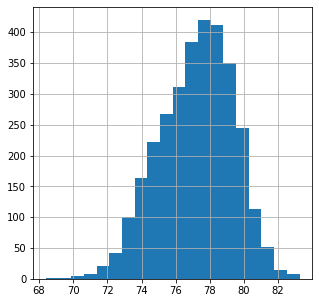

In [212]:
# Let's check the distribution of the dependant feature (i.e. our target value or 'y')
le_hist = le_geo_df['avg'].hist (bins=20, figsize = (5,5))

               avg
count  3142.000000
mean     77.202594
std       2.161420
min      68.400000
25%      75.700000
50%      77.400000
75%      78.750000
max      83.250000


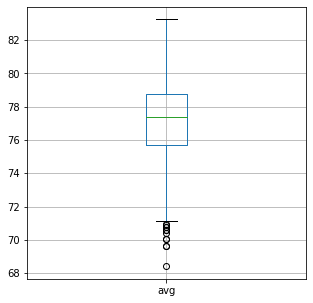

In [213]:
#checking the box plots to understand where the outliers can be found
le_boxplt = le_geo_df[['avg']].boxplot(figsize = (5,5))
print(le_geo_df[['avg']].describe())

We can see that the dependent feature follows a skewed normal distribution. There are a number of outliers on the lower range that are attributing to the skew. We need to find features that have a similar shape.
Let's drop features that would not establish a pattern because they are not in enough counties or do not have much variation.

We don't want to be too aggressive in removing this data, as we don't want to negatively affect the model by removing anything helpful. At the same time, we are removing some now to speed up the other parts of the process.

In [214]:
#drop features that occur in 5 or less counties with a maximum of 1 per county
venue_feat_mod_df = venue_feat_df.drop(columns = venue_feat_df.columns[(venue_feat_df.count() < 6) & (venue_feat_df.max() == 1)])

venue_feat_mod_df

shortName,Acupuncturist,Alternative Healer,American,Animal Shelter,Apres Ski Bar,Arcade,Art Gallery,Asian,Assisted Living,Athletics & Sports,...,Waterfall,Waterfront,Weight Loss Center,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings,Yoga Studio,Zoo
targetCounty,,,,,,,,,,,,,,,,,,,,,
01001,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01003,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,1.0
01005,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01007,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
01009,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56037,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN
56039,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.0,NaN
56041,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN


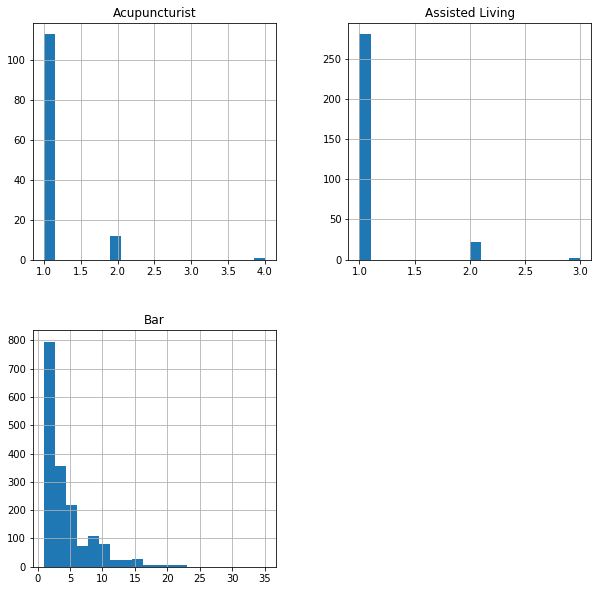

In [640]:
#The features do not match a normal dirstribution as we see in our target values
three_col_hist = venue_feat_mod_df[['Acupuncturist','Bar','Assisted Living']].hist (bins=20, figsize = (10,10))

In [218]:
#sparse matrix test
#The number of zero-valued elements divided by the total number of elements 
#(e.g., m × n for an m × n matrix) is called the sparsity of the matrix 
#(which is equal to 1 minus the density of the matrix). 
#Using those definitions, a matrix will be sparse when its sparsity is greater than 0.5.

zeros, vals = (venue_feat_mod_df.fillna(0)!=0).apply(pd.value_counts).transpose().sum()
garbage, ones = (venue_feat_mod_df.fillna(0)==1).apply(pd.value_counts).transpose().sum()
sparse_calc = zeros/(vals + zeros)
print("This is a {} sparse matrix because the sparcity is {}".format(sparse_calc > 0.5, sparse_calc))
print("{} elements have a value of zero.".format(zeros))
print("{} elements have a value of one.".format(ones))
print("{} elements have a value greater than one.".format(vals-ones))


This is a True sparse matrix because the sparcity is 0.9323484490914425
803965 elements have a value of zero.
30350 elements have a value of one.
27986 elements have a value greater than one.


NOTE: Since there are no features with a value between 0 and 1, using a log function would not help normalize the data. We need to look into other means for our features to better fit the target data.

In [219]:
venue_feat_mod_df.sum().sort_values(ascending = False)[:20]

shortName
Fast Food             39812.0
Doctor's Office       21530.0
Pizza                 19510.0
Church                15134.0
Park                  11155.0
Medical               11002.0
Bar                    7427.0
Dentist's Office       7252.0
Trail                  5405.0
Hospital               5306.0
Factory                4595.0
BBQ                    3646.0
Veterinarians          3339.0
Gym / Fitness          2971.0
Chiropractors          2953.0
Gym                    2751.0
Fried Chicken          1690.0
Mexican                1519.0
Physical Therapist     1279.0
Smoke Shop             1077.0
dtype: float64

In [266]:
#Let's see if perCapita and perSqMi features will better match the target 
#We'll merge our two main dataframes together before generating these new features

le_feat_df = le_geo_df.merge(venue_feat_mod_df, left_on = 'fipsCode', right_index = True)

In [267]:
#Verify the counties we did not get data on 
print('Population lost = {}'.format(le_geo_df['totalPop'][le_geo_df['fipsCode'].isin(le_feat_df['fipsCode'])==False].sum()))
le_geo_df[le_geo_df['fipsCode'].isin(le_feat_df['fipsCode'])==False]

Population lost = 165093


,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode,totalPop
13,0500000US02050,40570.004,"MULTIPOLYGON (((-173.11691 60.51600, -173.0980...",AK-BETHEL,Alaska,Bethel,77.95,02050,AK,18216
17,0500000US02164,23652.009,"MULTIPOLYGON (((-157.02607 56.55976, -156.9909...",AK-LAKEANDPENINSULA,Alaska,Lake and Peninsula,77.95,02164,AK,1587
19,0500000US02188,35572.584,"POLYGON ((-159.59358 65.52269, -159.80101 65.5...",AK-NORTHWESTARCTIC,Alaska,Northwest Arctic,77.95,02188,AK,7671
74,0500000US02270,17081.433,"POLYGON ((-160.53414 61.94726, -160.46948 61.8...",AK-WADEHAMPTON,Alaska,Wade Hampton,77.95,02270,AK,8303
293,0500000US26083,540.112,"MULTIPOLYGON (((-88.68443 48.11579, -88.67563 ...",MI-KEWEENAW,Michigan,Keweenaw,77.75,26083,MI,2113
340,0500000US31183,575.182,"POLYGON ((-98.29576 41.74118, -98.75222 41.740...",NE-WHEELER,Nebraska,Wheeler,79.15,31183,NE,805
367,0500000US31117,858.976,"POLYGON ((-101.26969 41.39493, -101.40726 41.3...",NE-MCPHERSON,Nebraska,McPherson,78.50,31117,NE,492
503,0500000US46095,1307.306,"POLYGON ((-100.33897 43.71694, -100.23085 43.7...",SD-MELLETTE,South Dakota,Mellette,73.20,46095,SD,2042
576,0500000US48263,902.507,"POLYGON ((-100.65587 32.96347, -101.03866 32.9...",TX-KENT,Texas,Kent,76.15,48263,TX,726
677,0500000US02185,88695.413,"POLYGON ((-165.35998 68.02805, -165.43044 68.0...",AK-NORTHSLOPE,Alaska,North Slope,77.95,02185,AK,9872


We now know we have two things working against us, lots of sparse data and data that does not match our targets. We'll need to do some feature development to get some decent results.

### Feature development
We now have 277 features that are simply raw counts of venues per category, plus the county population & area. We know the data does not fit well with the life expectancy target values. Let's create some more features that better model our targets.

In [268]:
#These are the columns we want to model our new ones from
cols = le_feat_df.columns[-277:]

#loop through each column to create a per capita feature, a per square Mi, and the log of each
for col in cols:
    colname = col.lower().replace(' ','').replace('\'','')+'PerCap'
    le_feat_df[colname] = (le_feat_df[col]/le_feat_df['totalPop'])
    colname = col.lower().replace(' ','').replace('\'','')+'PerSqMi'
    le_feat_df[colname] = (le_feat_df[col]/le_feat_df['censusArea'])
    colname = col.lower().replace(' ','').replace('\'','')+'PerCapLog'
    le_feat_df[colname] = np.log(le_feat_df[col]/le_feat_df['totalPop'])
    colname = col.lower().replace(' ','').replace('\'','')+'PerSqMiLog'
    le_feat_df[colname] = np.log(le_feat_df[col]/le_feat_df['censusArea'])
    
le_feat_df

,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode,totalPop,...,wingsPerCapLog,wingsPerSqMiLog,yogastudioPerCap,yogastudioPerSqMi,yogastudioPerCapLog,yogastudioPerSqMiLog,zooPerCap,zooPerSqMi,zooPerCapLog,zooPerSqMiLog
0,0500000US01001,594.436,"POLYGON ((-86.49677 32.34444, -86.71790 32.402...",AL-AUTAUGA,Alabama,Autauga,76.05,01001,AL,55601,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,0500000US01009,644.776,"POLYGON ((-86.57780 33.76532, -86.75914 33.840...",AL-BLOUNT,Alabama,Blount,75.85,01009,AL,57840,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0500000US01017,596.531,"POLYGON ((-85.18413 32.87053, -85.12342 32.772...",AL-CHAMBERS,Alabama,Chambers,73.25,01017,AL,33615,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,0500000US01021,692.854,"POLYGON ((-86.51734 33.02057, -86.51596 32.929...",AL-CHILTON,Alabama,Chilton,73.85,01021,AL,44153,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,0500000US01033,592.619,"POLYGON ((-88.13999 34.58170, -88.13925 34.587...",AL-COLBERT,Alabama,Colbert,74.10,01033,AL,54762,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3137,0500000US51001,449.496,"MULTIPOLYGON (((-75.24227 38.02721, -75.29687 ...",VA-ACCOMACK,Virginia,Accomack,75.05,51001,VA,32412,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3138,0500000US51021,357.725,"POLYGON ((-81.22510 37.23487, -81.20477 37.243...",VA-BLAND,Virginia,Bland,76.30,51021,VA,6293,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3139,0500000US51027,502.763,"POLYGON ((-81.96830 37.53780, -81.92787 37.512...",VA-BUCHANAN,Virginia,Buchanan,73.15,51027,VA,21221,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3140,0500000US51037,475.271,"POLYGON ((-78.44332 37.07940, -78.49303 36.891...",VA-CHARLOTTE,Virginia,Charlotte,75.25,51037,VA,11938,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


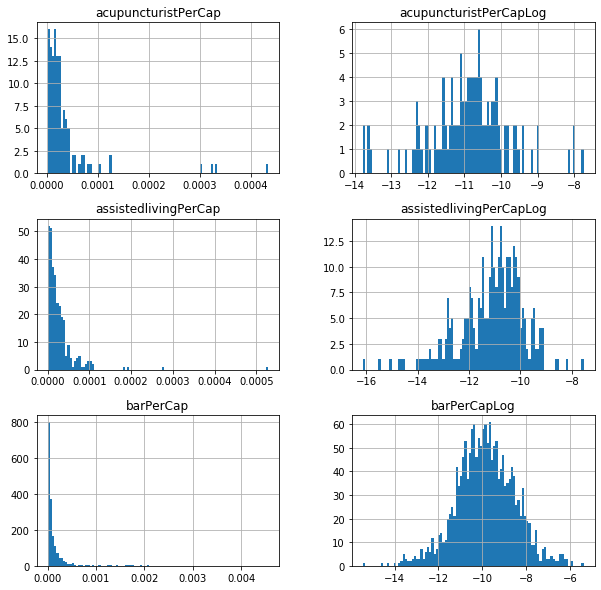

In [269]:
three_col_hist = le_feat_df[['acupuncturistPerCap','barPerCap','assistedlivingPerCap','acupuncturistPerCapLog','barPerCapLog','assistedlivingPerCapLog']].hist (bins = 100,figsize = (10,10))

We can see that the log of the perCap data looks closet to our target data. Now let's see how these features correlate to out target data. 

In [1120]:
#Check for correlations using pearson correlation
le_corr_df = le_feat_df.drop(columns = ['geoId','geometry','code','state','county','fipsCode','stateCode'])

cor = le_corr_df.corr()

#Correlation with output variable
cor_abs = cor["avg"].abs()
cor_abs.rename(columns={ "avg": "abs" }, inplace = True)
cor_target = pd.concat([cor["avg"], cor_abs], axis=1)
cor_target.rename(columns={ cor_target.columns[1]: "abs" }, inplace = True)
cor_target.sort_values('abs', ascending = False).head(20)

,avg,abs
hillPerCapLog,-1.000000,1.000000
avg,1.000000,1.000000
hillPerCap,-1.000000,1.000000
Hill,1.000000,1.000000
hillPerSqMi,1.000000,1.000000
hillPerSqMiLog,1.000000,1.000000
salon/barbershopPerCap,-0.922308,0.922308
performingartsPerCapLog,-0.882250,0.882250
dessertsPerCapLog,-0.873264,0.873264
boat/ferryPerSqMi,-0.870655,0.870655


We can see that there are some highly correlated features from the new ones we created. The Log versions are generally favored but not absolutely.

Of course, we'll see how this all works once we start modeling the data. But for comparison, let's see how our original data correlates.

In [286]:
#Check for correlations on just the original features
le_corr_orig_df = le_corr_df.iloc[:,:280]
cor2 = le_corr_orig_df.corr()

#Correlation with output variable
cor2_abs = cor2["avg"].abs()
cor2_abs.rename(columns={ "avg": "abs" }, inplace = True)
cor2_target = pd.concat([cor2["avg"], cor2_abs], axis=1)
cor2_target.rename(columns={cor2_target.columns[1]: "abs" }, inplace = True)
cor2_target.sort_values('abs', ascending = False).head(20)

,avg,abs
Hill,1.000000,1.000000
avg,1.000000,1.000000
Herbs & Spices Store,-0.652078,0.652078
Landmark,-0.642557,0.642557
Shopping Plaza,0.510272,0.510272
Sikh Temple,-0.500000,0.500000
Elementary School,-0.481988,0.481988
Farmer's Market,-0.433000,0.433000
Nutritionist,0.417328,0.417328
Sporting Goods,0.398204,0.398204


Now we can see that our new features have better correlations with our life expectancy data. Let's start finding a model that can predict life expectacy.

# Model Development
Now that we have our features ready it's time to create our X, y data and start creating the models. We'll start with the simpliest model possible and see where the data takes us.

In [711]:
#First let's create a subset of the data for X,y
X = np.asanyarray(le_feat_df.drop(columns = ['geoId','geometry','code','avg','state','county','fipsCode','stateCode']).fillna(0))
y = np.asanyarray(le_feat_df[['avg']])

X = preprocessing.StandardScaler().fit(X).transform(X)

Residual sum of squares: 1.38
Variance score: 0.71


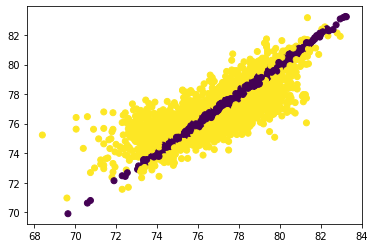

In [712]:
#let's run a quick model to see what's we have with this unnormalized data
regr = linear_model.LinearRegression()
regr.fit (X, y)

y_hat= regr.predict(X)
print("Residual sum of squares: %.2f"
      % np.mean((y_hat - y) ** 2))

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(X, y))
clr = (y- y_hat)**2 > .1 #to visually separate the accurate ones
plt.scatter(y,y_hat, c = clr)

Our first test seems pretty decent without any model tuning. Even though the variance score is not super accurate that does not mean it's not overfitting the data. Let's split our data and see how well it does.

In [713]:
#create training and test sub sets of data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)

Training Set
Residual sum of squares: 1.16
Variance score: 0.75


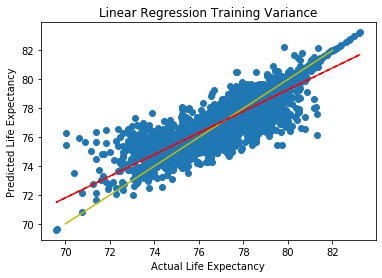

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [714]:
#let's run the training set through the same regression
regr.fit (X_train, y_train)

print("Training Set")
y_hat_train= regr.predict(X_train)
print("Residual sum of squares: %.2f"
      % np.mean((y_hat_train - y_train) ** 2))

y_train_df = pd.DataFrame(y_train)
y_hat_train_df = pd.DataFrame(y_hat_train)


# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(X_train, y_train))
plt.scatter(y_train,y_hat_train)
plt.plot([70,82],[70,82], color='y', label = "label")
plt.title('Linear Regression Training Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')

z = np.polyfit(y_train_df.iloc[:,0], y_hat_train_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y_train,p(y_train_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

Test Set
Residual sum of squares: 6776442740395669979136.00
Variance score: -1393718023804902178816.00


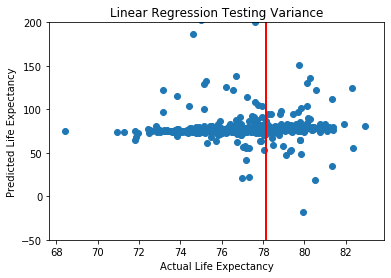

Red line shows trend of our prediction.


In [1116]:
print("Test Set")
y_hat_test= regr.predict(X_test)
print("Residual sum of squares: %.2f"
      % np.mean((y_hat_test - y_test) ** 2))

y_test_df = pd.DataFrame(y_test)
y_hat_test_df = pd.DataFrame(y_hat_test)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(X_test, y_test))
plt.scatter(y_test,y_hat_test)
plt.title('Linear Regression Testing Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')
plt.ylim(-50,200)


#also look into this code example for creating the line
# may need
z = np.polyfit(y_test_df.iloc[:,0], y_hat_test_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y_test,p(y_test_df.iloc[:,0]),"r--")
plt.show()

print("Red line shows trend of our prediction.")

Now it's obvious that the model has overfit the data. Although some predictions are within the Life Expectancy range other are not even positive.

Let's try a model that allows us to use regularization. For that we'll use the Ridge linear regression.

### Ridge Regression
This model allows us to better fit the data by applying a regularization parameter. In order to tune the hyperparameters we loop through various configurations and store the results in a dataframe. This allows us to chart the result and find the optimal configuration. This is designed to allow for multiple iterations with manual tuning in between each iteration. 

This method is used for our subsequent models as well.

In [440]:
#we're going to store the results in a dataframe that we can later use for analysis and visualization
cfg_result_ridge = pd.DataFrame(columns=['alpha','solver','intercept','poly','train score','test score'])

In [441]:
#here is our configuration loop 
#find optimal hyperparams

a_cfg = [10,100,1000,10000,100000] #larger is more regularization
solver_cfg = ['auto', 'svd', 'cholesky', 'lsqr', 'sparse_cg', 'sag'] #comparing solvers  
intrcpt_cfg = [True] #not used for this iteration
p_cfg = [1] #sticking with no polynomials for this iteration

for a in range(0,len(a_cfg)):
    for s in range(0,len(solver_cfg)):
        for p in range(0,len(p_cfg)):
            for i in range(0,len(intrcpt_cfg)):
                poly = PolynomialFeatures(p_cfg[p])
                X_train_p = poly.fit_transform(X_train)
                X_valid_p = poly.fit_transform(X_test)

                Ridge_LR = linear_model.Ridge(alpha=a_cfg[a], solver=solver_cfg[s], fit_intercept=intrcpt_cfg).fit(X_train_p,y_train)
                lrt_yhat = Ridge_LR.predict(X_train_p)
                lrv_yhat = Ridge_LR.predict(X_test_p)
                lrt_scr = Ridge_LR.score(X_train_p, y_train)
                lrv_scr = Ridge_LR.score(X_test_p, y_test) 

                result_line = [{"alpha":str(a_cfg[a]), "solver":solver_cfg[s],"intercept": intrcpt_cfg[i], "poly":p_cfg[p], "train score": lrt_scr,"test score":lrv_scr}]
                cfg_result_ridge = cfg_result_ridge.append(result_line, ignore_index=True)

#Best score
best_logr_score = cfg_result_ridge['test score'].max()
best_logr_train_score = cfg_result_ridge['train score'].max()
print("The best validation score is ", best_logr_score)            
#Show top configs by validation accuracy             
cfg_result_ridge.sort_values(by=['test score','train score'], ascending = False).head(30)

The best validation score is  0.40675575865488134


,alpha,solver,intercept,poly,train score,test score
17,1000,sag,True,1,0.548605,0.406756
15,1000,lsqr,True,1,0.553929,0.403924
12,1000,auto,True,1,0.554037,0.403919
14,1000,cholesky,True,1,0.554037,0.403919
13,1000,svd,True,1,0.554037,0.403919
16,1000,sparse_cg,True,1,0.554020,0.403912
21,10000,lsqr,True,1,0.400384,0.338700
22,10000,sparse_cg,True,1,0.400417,0.338676
19,10000,svd,True,1,0.400418,0.338658
18,10000,auto,True,1,0.400418,0.338658


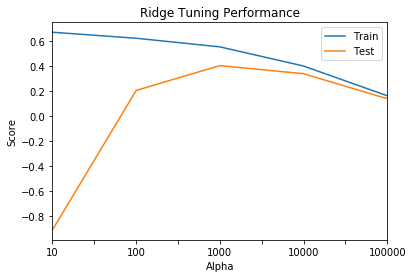

In [1124]:
#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
result_grid = cfg_result_ridge[cfg_result_ridge['solver']=='auto'][['alpha','train score','test score']]
result_grid.sort_values('alpha', inplace = True)
result_grid.set_index(['alpha'], inplace = True)

result_grid['train score'].plot(kind='line')
result_grid['test score'].plot(kind='line')

plt.title('Ridge Tuning Performance')
plt.ylabel('Score')
plt.xlabel('Alpha')
plt.legend(('Train', 'Test'))
plt.show() 

In [672]:
with open('result_grid.json', 'w') as outfile:
    jdump = cfg_result_ridge.to_json(orient='records')
    json.dump(jdump, outfile)

##### The Alpha Affect
As the graph illustrates, when we increase our regularization (alpha) the test scores can increase while the training score decreases. This shows that regularization is working and finding a better fit. As we apply too much regularization we see both scores drop. 

This also shows the limit of how much regularization alone can help.

Let's see how the results look, so far.

In [458]:
#Get the best values to use  
top_valid = cfg_result_ridge.loc[(cfg_result_ridge['test score'] == best_logr_score)]
top_both = top_valid.loc[(top_valid['train score'] == top_valid['train score'].max())]

a= top_both['alpha'].values[0]
i = top_both['intercept'].values[0]
solvr = top_both['solver'].values[0]
p = top_both['poly'].values[0]

#Final run on training data using the top performing config
poly = PolynomialFeatures(p)
X_p = poly.fit_transform(X_train)
Ridge_LR = linear_model.Ridge(alpha=a, solver=solvr, fit_intercept=i).fit(X_p,y_train)

Variance score: 0.75


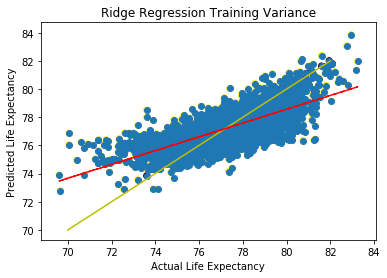

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [675]:
rlr_yhat = Ridge_LR.predict(X_train_p)
rlrt_yhat = Ridge_LR.predict(X_test_p)

y_train_df = pd.DataFrame(y_train)
y_hat_train_df = pd.DataFrame(rlr_yhat)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(X_train, y_train))
plt.scatter(y_train,rlr_yhat)
plt.plot([70,82],[70,82], color='y', label = "label")
plt.title('Ridge Regression Training Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')

z = np.polyfit(y_train_df.iloc[:,0], y_hat_train_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y_train,p(y_train_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

Variance score: -1393718023804902178816.00


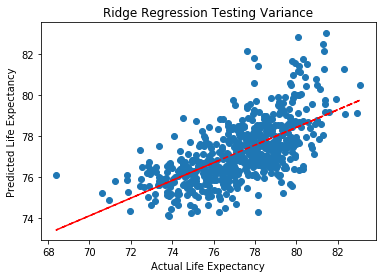

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [742]:
y_test_df = pd.DataFrame(y_test)
y_hat_test_df = pd.DataFrame(rlrt_yhat)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % regr.score(X_test, y_test))
plt.scatter(y_test,rlrt_yhat)
plt.title('Ridge Regression Testing Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')
plt.plot([70,82],[70,82], color='y', label = "label")

z = np.polyfit(y_test_df.iloc[:,0], y_hat_test_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y_test,p(y_test_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

We're making progress in the right direct. The predictions are within the correct range for life expectancies, but the accuracy needs some major improvement.  

### More Data Analysis & Introduction of Cross Validation Models

We currently have over 1,300 features in our model. Let's have a closer look to see if we can get any more insight into our data that would help us build a better model. We already know we're dealing with a sparse matrix, so perhaps culling the number of features would help the model. We can use SciKit's RFE function for this. But first let's reexamine the correlation. 

In [466]:
#our top 10 correlations
cor_target.sort_values('abs', ascending = False).head(10)

,avg,abs
hillPerCapLog,-1.000000,1.000000
avg,1.000000,1.000000
hillPerCap,-1.000000,1.000000
Hill,1.000000,1.000000
hillPerSqMi,1.000000,1.000000
hillPerSqMiLog,1.000000,1.000000
salon/barbershopPerCap,-0.922308,0.922308
performingartsPerCapLog,-0.882250,0.882250
dessertsPerCapLog,-0.873264,0.873264
boat/ferryPerSqMi,-0.870655,0.870655


The first 5 features are just variations on the 'Hill', all with complete correlation. Why do we not have a better regression with such a highly correlated feature? Let's look at the data.

In [467]:
#shows all records with Hill feature
le_feat_df[le_feat_df['Hill'].isna()==False]

,geoId,censusArea,geometry,code,state,county,avg,fipsCode,stateCode,totalPop,...,wingsPerCapLog,wingsPerSqMiLog,yogastudioPerCap,yogastudioPerSqMi,yogastudioPerCapLog,yogastudioPerSqMiLog,zooPerCap,zooPerSqMi,zooPerCapLog,zooPerSqMiLog
297,0500000US26103,1808.401,"POLYGON ((-88.04455 46.91247, -88.03291 46.909...",MI-MARQUETTE,Michigan,Marquette,79.05,26103,MI,66516,...,NaN,NaN,0.000015,0.000553,-11.105198,-7.500198,NaN,NaN,NaN,NaN
706,0500000US06075,46.873,"MULTIPOLYGON (((-122.41870 37.85272, -122.4344...",CA-SANFRANCISCO,California,San Francisco,81.60,06075,CA,883305,...,NaN,NaN,0.000001,0.021334,-13.691426,-3.847442,NaN,NaN,NaN,NaN


As we can see, the feature is highly correlated but only for two counties. Let's see what happens when we cross correlation with frequency.

In [499]:
le_freq_df = le_feat_df.drop(columns = ['geoId','geometry','code','state','county','fipsCode','stateCode'])

freq_df = pd.DataFrame(data = le_freq_df.count()/3113, columns = ['frequency']) #gets the % of counties with a feature
freq_df = freq_df.merge(cor_target, left_index=True, right_index=True) #merges the correlation data
freq_df['freqXabs'] = np.multiply(freq_df['frequency'],freq_df['abs']) #creates our new metric
freq_df.sort_values('freqXabs', ascending = False).head(50) #shows the top 20 attributes

,frequency,avg,abs,freqXabs
avg,1.000000,1.000000,1.000000,1.000000
fastfoodPerCapLog,0.917122,-0.373909,0.373909,0.342920
fastfoodPerCap,0.917122,-0.274079,0.274079,0.251364
Park,0.730164,0.323310,0.323310,0.236069
doctorsofficePerCapLog,0.788950,-0.254825,0.254825,0.201044
bbqPerCapLog,0.520077,-0.385738,0.385738,0.200613
totalPop,1.000000,0.198872,0.198872,0.198872
medicalPerCapLog,0.763572,-0.229643,0.229643,0.175349
Trail,0.470928,0.362358,0.362358,0.170645
churchPerCapLog,0.892708,-0.179774,0.179774,0.160486


Now we have a better picture of the features that occur enough that they would have some impact. Unsuprisingly we see a lot of the feature variations stacked together, but some times they are not. For example Trail shows up, but the trailPerSqMiLog is in 21st place, trailPerSqMi is at 45th, and trailPerCap is 89th. 

There's no hard and fast rule for having the right number of features. We do have a lot of overlapping features. It's also likely there is a lot of noise in the data. The noise being features that do not relate to life expectancy at all. Let's create a new cut of data with the top 200 features and we'll use this for our model iterations.

It's unlikely that a new cut of data would improve the accuracy but we want to see how different cuts of data affect the regression accuracy.

In [561]:
feat_col = freq_df.sort_values('freqXabs', ascending = False).head(201).tail(200).index #takes 200 top features after avg
cor_feat_df = le_feat_df[feat_col]

#### Using RFE
RFE stands for recursive feature elimination. This process will use the Ridge regression model to estimate how important each feature is. We manually pick the number of features we want. In this case, we're using the Ridge model with out optimized hyperparameters. For simplicity sake we will use this cut of features with the other models we develop. 

In [562]:
#let's use RFE to select features

rfe_feat_df = le_feat_df.drop(columns = ['geoId','geometry','code','avg','state','county','fipsCode','stateCode'])
X_rfe = np.ascontiguousarray(le_feat_df.drop(columns = ['geoId','geometry','code','avg','state','county','fipsCode','stateCode']).fillna(0))
y_rfe = np.ascontiguousarray(le_feat_df['avg'])

rfe_selector = RFE(estimator=linear_model.Ridge(alpha=1000, solver='auto', fit_intercept=True), n_features_to_select=200, step=1, verbose=0)
rfe_selector.fit(X_rfe, y_rfe)
rfe_support = rfe_selector.get_support()
rfe_feature = rfe_feat_df.loc[:,rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')
rfe_feat_df = le_feat_df[rfe_feature]
rfe_feat_df.head()


200 selected features


,Alternative Healer,American,BBQ,Bar,Café,Chinese,Chiropractors,Convenience Store,Diner,Eye Doctor,...,vegetarian/veganPerCapLog,veterinariansPerCapLog,veterinariansPerSqMiLog,vineyardPerCapLog,warehousePerCapLog,weightlosscenterPerCapLog,winebarPerSqMiLog,wineryPerCapLog,yogastudioPerSqMiLog,zooPerCapLog
0,1.0,NaN,5.0,2.0,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,-10.925956,-6.387613,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,NaN,NaN,3.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-10.965436,-6.468903,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,-10.422728,-6.391131,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,1.0,...,NaN,-10.002269,-5.847672,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,1.0,NaN,NaN,NaN,3.0,1.0,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [569]:
#Let's re-cut our X data and creating new train & test sets
cor_feat_df
rfe_feat_df

X1 = np.asanyarray(le_feat_df.drop(columns = ['geoId','geometry','code','avg','state','county','fipsCode','stateCode']).fillna(0))
X2 = np.asanyarray(rfe_feat_df.fillna(0))
X3 = np.asanyarray(cor_feat_df.fillna(0))
y = np.asanyarray(le_feat_df[['avg']]) #re-createing this JIC

X1 = preprocessing.StandardScaler().fit(X1).transform(X1)
X2 = preprocessing.StandardScaler().fit(X2).transform(X2)
X3 = preprocessing.StandardScaler().fit(X3).transform(X3)

In [571]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y, test_size=0.2, random_state=2)
X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y, test_size=0.2, random_state=2)
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y, test_size=0.2, random_state=2)

### Cross Validation Models
Since we are dealing with a lot of sparse data with low correlation, the models we have used needed to use regularization to generalize the fit. This has allowed us to get up to 0.40 validation on our test set, but our training validation has dropped from 0.75 with linear regression to 0.56. Using Cross Validation should allow us to improve both our train and test results.

### RidgeCV
This is the cross validation version of the Ridge regression we used to improve our test score. Let's see how we can tune it to work better than Ridge.

In [581]:
#We'll store our results here
cfg_result_ridgecv = pd.DataFrame(columns=['alpha','gcv','intercept','poly','train score','test score','data'])

In [720]:
#Ridge CV
#find optimal hyperparams

#run 1
a_cfg = [1, 10, 100, 1000, 10000] 
gcv_cfg = ['auto', 'svd', 'eigen']
cv_cfg=[2,4,6,9,16]

#run 2
a_cfg = [1, 5] 
gcv_cfg = ['auto']

#run 3
a_cfg = [2, 3, 4] 
gcv_cfg = ['auto']

for c in range(0,len(cv_cfg)):
    for s in range(0,len(gcv_cfg)):
        for d in range(1,4):
            if d == 1:
                X_local_train = X1_train
                X_local_test = X1_test
                y_local_train = y1_train
                y_local_test = y1_test
            elif d == 2:
                X_local_train = X2_train
                X_local_test = X2_test
                y_local_train = y2_train
                y_local_test = y2_test
            elif d == 3:
                X_local_train = X3_train
                X_local_test = X3_test
                y_local_train = y3_train
                y_local_test = y3_test

            RidgeCV_LR = linear_model.RidgeCV(alphas=a_cfg, gcv_mode=gcv_cfg[s], cv = cv_cfg[c], fit_intercept=True).fit(X_local_train,y_local_train)
            rcv_yhat = RidgeCV_LR.predict(X_local_train)
            rcvt_yhat = RidgeCV_LR.predict(X_local_test)
            rcv_scr = RidgeCV_LR.score(X_local_train, y_local_train)
            rcvt_scr = RidgeCV_LR.score(X_local_test, y_local_test) 

            result_line = [{"alpha": RidgeCV_LR.alpha_, "cv":str(cv_cfg[c]), "gcv":gcv_cfg[s],"intercept": True, "poly":0, "train score": rcv_scr,"test score":rcvt_scr, "data":d}]
            cfg_result_ridgecv = cfg_result_ridgecv.append(result_line, ignore_index=True)

            #print(result_line)

#Best score
best_rcv_score = cfg_result_ridgecv['test score'].max()
best_rcv_train_score = cfg_result_ridgecv['train score'].max()
print("The best test score is ", best_rcvt_score)            
#Show top configs by test accuracy
cfg_result_ridgecv.sort_values(by=['test score','train score'], ascending = False).head(20)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)
/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


The best test score is  0.4461619326810361


/opt/anaconda3/lib/python3.7/site-packages/sklearn/model_selection/_search.py:814: DeprecationWarning: The default of the `iid` parameter will change from True to False in version 0.22 and will be removed in 0.24. This will change numeric results when test-set sizes are unequal.
  DeprecationWarning)


,alpha,cv,data,gcv,intercept,poly,test score,train score
47,5,2,3,auto,True,0,0.446162,0.495236
50,5,4,3,auto,True,0,0.446162,0.495236
53,5,6,3,auto,True,0,0.446162,0.495236
56,5,9,3,auto,True,0,0.446162,0.495236
59,5,16,3,auto,True,0,0.446162,0.495236
62,4,2,3,auto,True,0,0.445654,0.495488
65,4,4,3,auto,True,0,0.445654,0.495488
68,4,6,3,auto,True,0,0.445654,0.495488
71,4,9,3,auto,True,0,0.445654,0.495488
74,4,16,3,auto,True,0,0.445654,0.495488


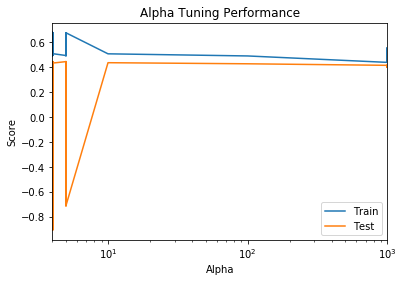

In [725]:
#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
result_grid = cfg_result_ridgecv[cfg_result_ridgecv['gcv']=='auto'][['alpha','train score','test score']]
result_grid.sort_values('alpha', inplace = True)
result_grid.set_index(['alpha'], inplace = True)

result_grid['train score'].plot(kind='line')
result_grid['test score'].plot(kind='line')

plt.title('Alpha Tuning Performance')
plt.ylabel('Score')
plt.xlabel('Alpha')
plt.legend(('Train', 'Test'))
plt.xscale('log')

plt.show() 

We found two inflection points where the alpha optimizes the test set score.

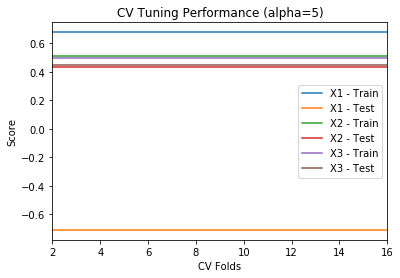

In [727]:
#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
result_grid_cv = cfg_result_ridgecv[(cfg_result_ridgecv['gcv']=='auto') & (cfg_result_ridgecv['data']==1) & (cfg_result_ridgecv['alpha']==5)][['cv','train score','test score']]
result_grid_cv['cv'] = result_grid_cv['cv'].astype('int')
result_grid_cv.sort_values('cv', ascending = True, inplace = True)
result_grid_cv.set_index(['cv'], inplace = True)

result_grid_cv2 = cfg_result_ridgecv[(cfg_result_ridgecv['gcv']=='auto') & (cfg_result_ridgecv['data']==2) & (cfg_result_ridgecv['alpha']==5)][['cv','train score','test score']]
result_grid_cv2['cv'] = result_grid_cv2['cv'].astype('int')
result_grid_cv2.sort_values('cv', ascending = True, inplace = True)
result_grid_cv2.set_index(['cv'], inplace = True)

result_grid_cv3 = cfg_result_ridgecv[(cfg_result_ridgecv['gcv']=='auto') & (cfg_result_ridgecv['data']==3) & (cfg_result_ridgecv['alpha']==5)][['cv','train score','test score']]
result_grid_cv3['cv'] = result_grid_cv3['cv'].astype('int')
result_grid_cv3.sort_values('cv', ascending = True, inplace = True)
result_grid_cv3.set_index(['cv'], inplace = True)

result_grid_cv['train score'].plot(kind='line')
result_grid_cv['test score'].plot(kind='line')
result_grid_cv2['train score'].plot(kind='line')
result_grid_cv2['test score'].plot(kind='line')
result_grid_cv3['train score'].plot(kind='line')
result_grid_cv3['test score'].plot(kind='line')

plt.title('CV Tuning Performance (alpha=5)')
plt.ylabel('Score')
plt.xlabel('CV Folds')
plt.legend(('X1 - Train', 'X1 - Test', 'X2 - Train', 'X2 - Test', 'X3 - Train', 'X3 - Test'))

plt.show() 

The number of folds did not seem to make a difference in accuracy.

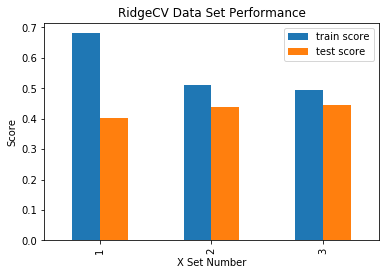

In [1123]:
#Let's just show a bar chart with the max scores for each dataset grouped by 

#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
max_grid_cv = cfg_result_ridgecv.groupby('data').max()

max_grid_cv[['train score', 'test score']].plot(kind='bar')

plt.title('RidgeCV Data Set Performance')
plt.ylabel('Score')
plt.xlabel('X Set Number')

plt.show() 

plt.show() 

Variance score: 0.45


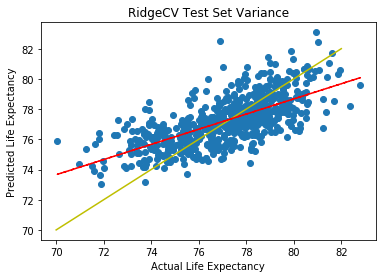

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [744]:
#Final run on training data using the top performing config
RidgeCV_LR = linear_model.RidgeCV(alphas=[5], gcv_mode='auto', cv = 2, fit_intercept=True).fit(X3_train,y3_train)

rcv_yhat = RidgeCV_LR.predict(X3_train)
rcvt_yhat = RidgeCV_LR.predict(X3_test)

y_test_rcv_df = pd.DataFrame(y3_test)
y_hat_test_rcv_df = pd.DataFrame(rcvt_yhat)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % RidgeCV_LR.score(X3_test, y3_test))
plt.scatter(y3_test,rcvt_yhat)
plt.plot([70,82],[70,82], color='y', label = "label")
plt.title('RidgeCV Test Set Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')

z = np.polyfit(y_test_rcv_df.iloc[:,0], y_hat_test_rcv_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y3_test,p(y_test_rcv_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

RidgeCV was able to make an improvement over our last model by adding in cross validation while tuning the right regularization (alpha) parameter. But, a score of 0.45 is still too lower to be considered an accurate prediction.

Regardless, it was interesting to see how the 3 different data sets performed. Overall, it appears that the smaller feature sets are outperforming the complete set. We'll keep all three sets in the mix for the next model as well.


## Why LassoLarsCV?
The LassoLars model is supposed to be better at handling sparse matrix of data. We're putting it through some iterations here to see if we can get better results than what RidgeCV is producing. It will be interesting to see if it can make better sense of the complete feature set.

In [611]:
cfg_result_llcv = pd.DataFrame(columns=['alpha max','alpha''intercept','poly','train score','test score','data'])

In [765]:
#find optimal hyperparams

#round 1
a_cfg = [10,20,100]
cv_cfg = [10,20,100] 

#round 2
a_cfg = [12,13,14,15,16,17,18,19]
cv_cfg = [10] 

#round 3
a_cfg = [500]
cv_cfg = [10]

#round 4
a_cfg = [10]
cv_cfg = [20]

#round 5
a_cfg = [10]
cv_cfg = [3]


for c in range(0,len(cv_cfg)):
    for a in range(0,len(a_cfg)):
        for d in range(1,4):
            if d == 1:
                X_local_train = X1_train
                X_local_test = X1_test
                y_local_train = y1_train
                y_local_test = y1_test
            elif d == 2:
                X_local_train = X2_train
                X_local_test = X2_test
                y_local_train = y2_train
                y_local_test = y2_test
            elif d == 3:
                X_local_train = X3_train
                X_local_test = X3_test
                y_local_train = y3_train
                y_local_test = y3_test

            LLCV = linear_model.LassoLarsCV(fit_intercept=True, max_iter=10000, normalize = False, cv=cv_cfg[c], max_n_alphas=a_cfg[a], n_jobs=2)
            LLCV.fit(X_local_train,y_local_train)

            llcv_yhat = LLCV.predict(X_local_train)
            llcvt_yhat = LLCV.predict(X_local_test)
            llcv_scr = LLCV.score(X_local_train, y_local_train)
            llcvt_scr = LLCV.score(X_local_test, y_local_test) 

            result_line = [{"alpha max": str(a_cfg[a]), "alpha":LLCV.alpha_ , "cv":str(cv_cfg[c]), "intercept": True, "poly":0, "train score": llcv_scr,"test score":llcvt_scr, "data": d}]
            cfg_result_llcv = cfg_result_llcv.append(result_line, ignore_index=True)

            print(result_line)

#Best score
best_llcv_score = cfg_result_llcv['test score'].max()
best_llcv_train_score = cfg_result_llcv['train score'].max()
print("The best test score is ", best_llcv_score)            
#Show top configs by test accuracy             
cfg_result_llcv.sort_values(by=['test score','train score'], ascending = False).head(10)

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[{'alpha max': '10', 'alpha': 0.008504330706875588, 'cv': '4', 'intercept': True, 'poly': 0, 'train score': 0.582657281843451, 'test score': 0.3841383400920288, 'data': 1}]


/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[{'alpha max': '10', 'alpha': 0.005470542559053985, 'cv': '4', 'intercept': True, 'poly': 0, 'train score': 0.4947059256384448, 'test score': 0.4333257364700517, 'data': 2}]


/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


[{'alpha max': '10', 'alpha': 0.03034904814527065, 'cv': '4', 'intercept': True, 'poly': 0, 'train score': 0.4435215992419428, 'test score': 0.41768847508744844, 'data': 3}]
The best test score is  0.4406373851424669


,alpha,alpha max,alphaintercept,cv,data,intercept,poly,test score,train score
25,0.002715,10,NaN,10,2,True,0,0.440637,0.504930
37,0.002715,10,NaN,10,2,True,0,0.440637,0.504930
40,0.002715,20,NaN,10,2,True,0,0.440637,0.504930
55,0.002773,10,NaN,100,2,True,0,0.440623,0.504719
58,0.002773,20,NaN,100,2,True,0,0.440623,0.504719
49,0.002791,20,NaN,20,2,True,0,0.440618,0.504655
34,0.002803,10,NaN,20,2,True,0,0.440613,0.504610
46,0.002803,10,NaN,20,2,True,0,0.440613,0.504610
85,0.002844,19,NaN,10,2,True,0,0.440596,0.504459
88,0.002204,500,NaN,10,2,True,0,0.440380,0.506660


/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


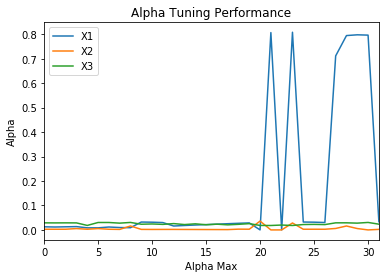

In [805]:
result_grid_llcv = cfg_result_llcv[['alpha','alpha max','data']]
result_grid_llcv.sort_values('alpha max', inplace = True)
result_grid_llcv.set_index(['alpha max'], inplace = True)

result_grid_llcv[result_grid_llcv['data']==1]['alpha'].plot(kind='line')
result_grid_llcv[result_grid_llcv['data']==2]['alpha'].plot(kind='line')
result_grid_llcv[result_grid_llcv['data']==3]['alpha'].plot(kind='line')


plt.title('Alpha Tuning Performance')
plt.ylabel('Alpha')
plt.xlabel('Max Alpha')
plt.legend(('X1','X2','X3'))
plt.xscale('linear')

plt.show() 

With LassoLarsCV, you can specify the max alpha but the model will set the actual alpha value. This made it difficult to determine how to best tune these settings, as it would behave different depending upon the data. It seemed that a combination of the data and the cross validation setting would affect how the model determined the regularization.

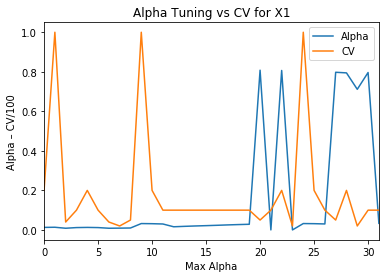

In [820]:
result_grid_llcv = cfg_result_llcv[cfg_result_llcv['data']==1][['alpha','alpha max','cv']]
result_grid_llcv.sort_values('alpha max', inplace = True)
result_grid_llcv.set_index(['alpha max'], inplace = True)
result_grid_llcv['cv'] = (result_grid_llcv['cv'].astype('int'))/100

result_grid_llcv['alpha'].plot(kind='line')
result_grid_llcv['cv'].plot(kind='line')


plt.title('Alpha Tuning vs CV for X1')
plt.ylabel('Alpha – CV/100')
plt.xlabel('Max Alpha')
plt.legend(('Alpha','CV'))
plt.xscale('linear')

plt.show() 

When looking at the relationship between the Max Alpha and CV settings for X1 it seems at the lower max alpha, the alpha values remain low regardless of the CV settings. When the Max Alpha is higher it's can be supressed when the CV is high, but it's not completely straightforward. 

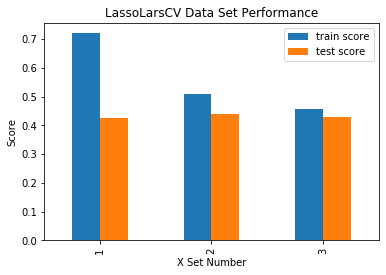

In [1122]:
#Let's just show a bar chart with the max scores for each dataset grouped by 

#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
max_grid_llcv = cfg_result_llcv.groupby('data').max()

max_grid_llcv[['train score', 'test score']].plot(kind='bar')

plt.title('LassoLarsCV Data Set Performance')
plt.ylabel('Score')
plt.xlabel('X Set Number')

plt.show() 

We were never able to get LassoLarsCV to best the RidgeCV. The best score it acheived was 0.4406 just shy of the 0.4461 from RidgeCV. It performed better on the RFE and freqXcorr feature sets than on the full feature set.

We'll do a final run with the top config and see how the plot looks.

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/validation.py:724: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Variance score: 0.44


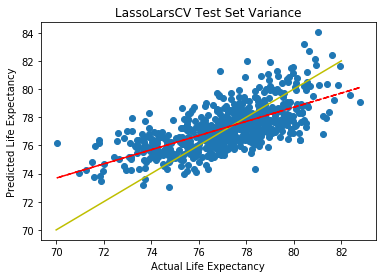

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [1125]:
#Final run on training data using the top performing config
LLCV = linear_model.LassoLarsCV(fit_intercept=True, max_iter=10000, normalize = False, cv=10, max_n_alphas=10, n_jobs=2)
LLCV.fit(X2_train,y2_train)

llcv_yhat = LLCV.predict(X2_train)
llcvt_yhat = LLCV.predict(X2_test)

y_test_llcv_df = pd.DataFrame(y2_test)
y_hat_test_llcv_df = pd.DataFrame(llcvt_yhat)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % LLCV.score(X2_test, y2_test))
plt.scatter(y2_test,llcvt_yhat)
plt.plot([70,82],[70,82], color='y', label = "label")
plt.title('LassoLarsCV Test Set Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')

z = np.polyfit(y_test_llcv_df.iloc[:,0], y_hat_test_llcv_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y2_test,p(y_test_llcv_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

Both RidgeCV and LassoLarsCV seemed to hit a will just below 0.45, far below our target for a reliable metric. We'll try one more model to see if we can make an improvement. 

## Neural Network
SciKit contains a NeuralNet model, MLPRegressor that can perform linear and non-linear regression. Here we tune it to see if it can best the RidgeCV model.

In [633]:
cfg_result_nn = pd.DataFrame(columns=['alpha','activ','hl','poly','lr','train score','test score','data'])

In [969]:
#Neural Network

#find optimal hyperparams
#round 1
a_cfg = [0.00001, 0.0001, 0.1] 
hl_cfg = [[10,10], [100,100], [100,100,100]] 
lr_cfg = [0.01,0.001,0.0001] 

#round 2
a_cfg = [2,4,8] 
hl_cfg = [[10,10], [100,100], [100,100,100]] 
lr_cfg = [0.001,0.0001, 0.00001] 

#...
#Final rounds for fine tuning
#round 11 X3 only
a_cfg = [2.1195, 2.12] 
hl_cfg = [[100,100]] 
lr_cfg = [0.000395, 0.0004] 

#round 11 X3 only
a_cfg = [2.119, 2.1192] 
hl_cfg = [[100,100]] 
lr_cfg = [0.0004,0.000401] 

for l in range(0,len(lr_cfg)):
    for a in range(0,len(a_cfg)):
        for h in range(0,len(hl_cfg)):
            for d in range(3,4):
                if d == 1:
                    X_local_train = X1_train
                    X_local_test = X1_test
                    y_local_train = y1_train.ravel()
                    y_local_test = y1_test.ravel()
                elif d == 2:
                    X_local_train = X2_train
                    X_local_test = X2_test
                    y_local_train = y2_train.ravel()
                    y_local_test = y2_test.ravel()
                elif d == 3:
                    X_local_train = X3_train
                    X_local_test = X3_test
                    y_local_train = y3_train.ravel()
                    y_local_test = y3_test.ravel()

                NN = neural_network.MLPRegressor(hidden_layer_sizes = hl_cfg[h], activation='logistic', solver='adam', alpha=a_cfg[a], learning_rate='adaptive', learning_rate_init = lr_cfg[l], max_iter=50000, random_state=4)
                NN.fit(X_local_train,y_local_train)

                nnt_yhat = NN.predict(X_local_train)
                nnv_yhat = NN.predict(X_local_test)
                nnt_scr = NN.score(X_local_train, y_local_train)
                nnv_scr = NN.score(X_local_test, y_local_test) 

                result_line = [{"alpha": str(a_cfg[a]), "activ":'logistic', "hl":hl_cfg[h], "poly":0, "lr": str(lr_cfg[l]),"train score": nnt_scr,"test score":nnv_scr, "data":d}]
                cfg_result_nn = cfg_result_nn.append(result_line, ignore_index=True)

                print(result_line)

#Best score
best_logr_score = cfg_result_nn['test score'].max()
best_logr_train_score = cfg_result_nn['train score'].max()
print("The best test score is ", best_logr_score)            
#Show top configs by test accuracy             

cfg_result_nn.sort_values(by=['test score','train score'], ascending = False).head(20)

[{'alpha': '4', 'activ': 'logistic', 'hl': [100, 100], 'poly': 0, 'lr': '0.0004', 'train score': 0.506309941772231, 'test score': 0.4539238708065916, 'data': 3}]
[{'alpha': '8', 'activ': 'logistic', 'hl': [100, 100], 'poly': 0, 'lr': '0.0004', 'train score': 0.4744815849297591, 'test score': 0.43148093676994326, 'data': 3}]
[{'alpha': '10', 'activ': 'logistic', 'hl': [100, 100], 'poly': 0, 'lr': '0.0004', 'train score': 0.4646686949859583, 'test score': 0.4263036423634695, 'data': 3}]
The best test score is  0.4941102039131969


,alpha,activ,hl,poly,lr,train score,test score,data,hl_str
499,2.1195,logistic,"[100, 100]",0,0.0004,0.635398,0.494110,3,"[100, 100]"
434,2.12,logistic,"[100, 100]",0,0.0004,0.635360,0.494099,3,"[100, 100]"
449,2.12,logistic,"[100, 100]",0,0.0004,0.635360,0.494099,3,"[100, 100]"
494,2.12,logistic,"[100, 100]",0,0.0004,0.635360,0.494099,3,"[100, 100]"
500,2.12,logistic,"[100, 100]",0,0.0004,0.635360,0.494099,3,"[100, 100]"
493,2.1205,logistic,"[100, 100]",0,0.0004,0.635322,0.494087,3,"[100, 100]"
450,2.125,logistic,"[100, 100]",0,0.0004,0.634963,0.493930,3,"[100, 100]"
476,2.116,logistic,"[100, 100]",0,0.00042,0.642718,0.493875,3,"[100, 100]"
497,2.1195,logistic,"[100, 100]",0,0.000395,0.633721,0.493820,3,"[100, 100]"
435,2.13,logistic,"[100, 100]",0,0.0004,0.634586,0.493819,3,"[100, 100]"


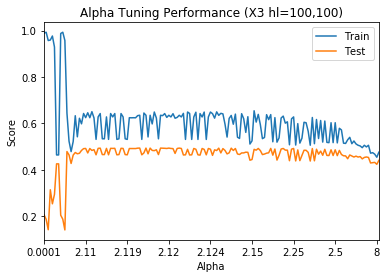

In [997]:
#Using the top performing hidden layers
for i in range(cfg_result_nn.shape[0]):
        cfg_result_nn.loc[i,'hl_str'] = str(cfg_result_nn.loc[i,'hl'])
result_grid_nn = cfg_result_nn[(cfg_result_nn['data'] == 3) & (cfg_result_nn['hl_str'] == '[100, 100]')][['alpha','hl','train score','test score']]
result_grid_nn.sort_values('alpha', inplace = True)
result_grid_nn.set_index(['alpha'], inplace = True)

result_grid_nn['train score'].astype('float').plot(kind='line')
result_grid_nn['test score'].astype('float').plot(kind='line')

plt.title('Alpha Tuning Performance (X3 hl=100,100)')
plt.ylabel('Score')
plt.xlabel('Alpha')
plt.legend(('Train', 'Test'))
#plt.ylim(0,1)
plt.show() 

It was a little hard to pin point the right alpha configuration while adjusting the learining rate, but you can see how the alpha improves the test scores starting around 2 and it starts to drop with values greater than 2.5.
The changes in the learning rate are contributing to the buzzsaw patterns.

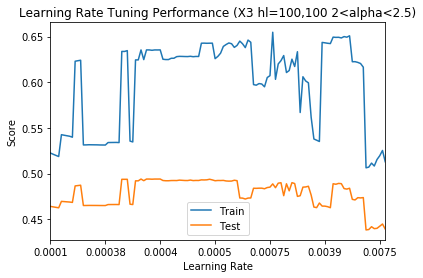

In [1013]:
#Using the top performing hidden layers
result_grid_lr_nn = cfg_result_nn[(cfg_result_nn['data'] == 3) & (cfg_result_nn['hl_str'] == '[100, 100]') & (cfg_result_nn['alpha'].astype(float) > 2) & (cfg_result_nn['alpha'].astype(float) < 2.5)][['lr','train score','test score']]
result_grid_lr_nn.sort_values('lr', inplace = True)
result_grid_lr_nn.set_index(['lr'], inplace = True)

result_grid_lr_nn['train score'].astype('float').plot(kind='line')
result_grid_lr_nn['test score'].astype('float').plot(kind='line')

plt.title('Learning Rate Tuning Performance (X3 hl=100,100 2<alpha<2.5)')
plt.ylabel('Score')
plt.xlabel('Learning Rate')
plt.legend(('Train', 'Test'))

plt.show() 

The learning rate is shown with the alpha bounded the optimal range (between 2 and 2.5). We found the optimal range to be around 0.0004 for the X3 data.

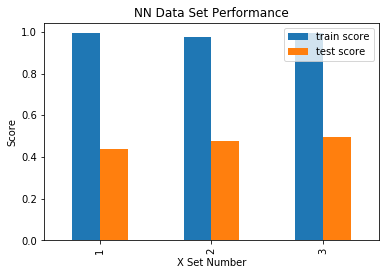

In [1121]:
#Let's just show a bar chart with the max scores for each dataset grouped by 

#Since the change in solvers did not make much of a difference, we are plotting the "auto" solver only
max_grid_nn = cfg_result_nn.groupby('data').max()

max_grid_nn[['train score', 'test score']].plot(kind='bar')

plt.title('NN Data Set Performance')
plt.ylabel('Score')
plt.xlabel('X Set Number')

plt.show() 

When tuned, the Neural Net was able to achieve our best score of all the models. The test score topped out at 0.494110. The Neural Net was able to break through the 0.45 barrier but could not beat 0.5. Ultimately, none of these models have made the cut. Let's see how the variance looks when we plot it out. 

Variance score: 0.49


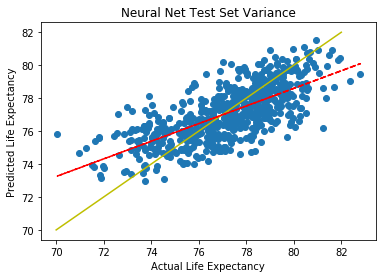

Yellow line shows perfect prediction.
Red line shows trend of our prediction.


In [1017]:
#Final run on training data using the top performing config
NN = neural_network.MLPRegressor(hidden_layer_sizes = [100,1000], activation='logistic', solver='adam', alpha=2.1195, learning_rate='adaptive', learning_rate_init = 0.0004, max_iter=50000, random_state=4)
NN.fit(X3_train,y3_train.ravel())


nn_yhat = NN.predict(X3_train)
nnt_yhat = NN.predict(X3_test)

y_test_nn_df = pd.DataFrame(y3_test)
y_hat_test_nn_df = pd.DataFrame(nnt_yhat)

# Explained variance score: 1 is perfect prediction
print('Variance score: %.2f' % NN.score(X3_test, y3_test))
plt.scatter(y3_test,nnt_yhat)
plt.plot([70,82],[70,82], color='y', label = "label")
plt.title('Neural Net Test Set Variance')
plt.ylabel('Predicted Life Expectancy')
plt.xlabel('Actual Life Expectancy')

z = np.polyfit(y_test_nn_df.iloc[:,0], y_hat_test_nn_df.iloc[:,0], 1)
p = np.poly1d(z)
pylab.plot(y2_test,p(y_test_nn_df.iloc[:,0]),"r--")
plt.show()

print("Yellow line shows perfect prediction.")
print("Red line shows trend of our prediction.")

## Mapping the Results
Although the results did not hit the numbers as we hoped, I think the best way to see the differences between the actual life expectancy and the predicted model is to show it using a choropleth map.
Here we'll build the life expectancy map with actual data. Then we'll put the entire dataset through the NeuralNet and map those results. 

In order to make this a fair visual comparison, the actual life expectancy map will not contain any outliers, to make the color scale closer. The predictive map will not include counties that had no data from Foursquare, and have no prediction.

In [1042]:
#There are about 15 outlier counties let's set them to the expected minumim and revisualize the data 

le_viz_df = le_geo_df.loc[:,:]

#determine the expected minimum based on the interquartile range
le_q1 = le_geo_df['avg'].quantile(0.25)
le_q3 = le_geo_df['avg'].quantile(0.75)
le_iqr = le_q3 - le_q1
min_avg_le = (le_q1 - 1.5 * le_iqr)

#determine the expected minmum  
print('Our minimum expected average life expectancy is: ', min_avg_le)

#update the viz data to the new minumum
le_viz_df.loc[le_viz_df['avg'] < min_avg_le, 'avg'] = min_avg_le


Our minimum expected average life expectancy is:  71.125


In [1117]:
geo_data_df.crs = {'init' :'epsg:4326'} #preps the geodf for acting as GeoJSON

# create a map for life expectancy
le_map = folium.Map(location=[39.8283, -98.5795], tiles='cartodbpositron', zoom_start=4)

# generate choropleth map using geo and LE data
le_map.choropleth(
    le_viz_df[['geoId', 'geometry']].to_json(),
    data=le_viz_df,
    columns=['geoId', 'avg'],
    key_on='properties.geoId',
    fill_color='RdYlBu', 
    fill_opacity=0.95, 
    line_opacity=0.2,
    legend_name='Life Expectancy per US County',
)

#Adding markers for the popup information
for i in range(0,len(le_viz_df)):
    folium.CircleMarker(
        location=[le_viz_df.iloc[i]['geometry'].centroid.y,le_geo_df.iloc[i]['geometry'].centroid.x],
        stroke=False,
        fill=True,
        fill_opacity=.001,
        radius=6,
        bubbling_mouse_events = True,
        popup=str("<b>County: {} </b><br> Life Exp: {}".format(le_viz_df.iloc[i]['county'],round(le_viz_df.iloc[i]['avg'],2)))
    ).add_to(le_map)


# display map
le_map

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


In [1118]:
#prep data for mapping
y_hat_map = np.round(NN.predict(X3),2)
map_predict = le_feat_df[['fipsCode','avg']]
map_predict['y_hat'] = y_hat_map

/opt/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


In [1119]:
le_feat_df.crs = {'init' :'epsg:4326'} #preps the geodf for acting as GeoJSON

# create a plain world map
us_map = folium.Map(location=[39.8283, -98.5795], tiles='cartodbpositron', zoom_start=4)

# generate choropleth map using geo and LE data
us_map.choropleth(
    le_feat_df[['fipsCode', 'geometry']].to_json(),
    data=map_predict,
    columns=['fipsCode', 'y_hat'],
    key_on='properties.fipsCode',
    fill_color='RdYlBu', 
    fill_opacity=0.95, 
    line_opacity=0.2,
    legend_name='Predicted Life Expectancy per US County',
)

#Adding markers for the popup information
for i in range(0,len(le_feat_df)):
    folium.CircleMarker(
        location=[le_feat_df.iloc[i]['geometry'].centroid.y,le_feat_df.iloc[i]['geometry'].centroid.x],
        stroke=False,
        fill=True,
        fill_opacity=.001,
        radius=6,
        bubbling_mouse_events = True,
        popup=str("<b>County: {} </b><br> Life Exp: {}".format(le_feat_df.iloc[i]['county'],round(map_predict.iloc[i]['y_hat'],2)))
    ).add_to(us_map)


# display map
us_map

/opt/anaconda3/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))


## In Conclusion
In comparing the maps, it's obvious that the prediction is not close enough to pass the visual test. But there are signs of encouragement. When looking at regions broadly, both maps show the South to have lower life expectancies and the North East to have higher. The west coast also looks similar although Texas seemed to take a beating around their major cities. 

It seems that if we had better coverage with our data we would be able to create a more accurate model in the future.

Finally, Let's see how our three main models performed when running on the complete set of all the counties.

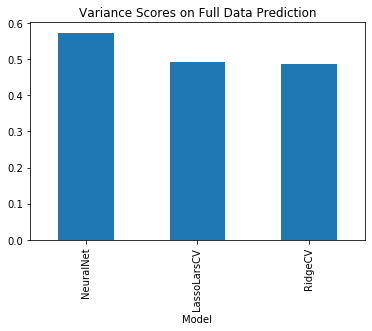

In [1106]:
nnfs = NN.score(X3,y)
llfs = LLCV.score(X2,y)
rcvfs = RidgeCV_LR.score(X3,y)
score_chart = pd.DataFrame({'Score':[nnfs,llfs,rcvfs],'Model':['NeuralNet', 'LassoLarsCV', 'RidgeCV']})
score_chart.set_index('Model', inplace = True)
score_chart.plot(kind='bar', title = "Variance Scores on Full Data Prediction", legend=False)